# Phase 1: Exploratory Data Analysis (EDA)
## Flood Impact Assessment - Multi-Temporal Satellite Segmentation

This notebook performs comprehensive exploratory data analysis on satellite imagery datasets (Germany and Louisiana) to understand:
- Dataset structure and file organization
- Image properties (shape, channels, data types)
- Class distribution and imbalance severity
- Data quality and alignment issues
- Temporal changes between pre and post-event images
- Geospatial distribution of flood impacts

**Datasets Analyzed:**
- Germany Training Public (pre/post event RGB images + GeoJSON annotations)
- Louisiana-East Training Public (same structure)
- Louisiana-West Test Public (for evaluation)

## 1. Setup & Environment

In [1]:
# Import core libraries
import sys
from pathlib import Path
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from PIL import Image
import json
import warnings
from collections import defaultdict, Counter
from typing import Dict, List, Tuple
import cv2
from scipy import stats
from sklearn.manifold import TSNE
from sklearn.decomposition import PCA
warnings.filterwarnings('ignore')

# Geospatial libraries
try:
    import rasterio
    from rasterio.plot import show
    HAS_RASTERIO = True
except ImportError:
    HAS_RASTERIO = False
    print("rasterio not available - skipping advanced geospatial features")

try:
    import geopandas as gpd
    import folium
    HAS_GEOSPATIAL = True
except ImportError:
    HAS_GEOSPATIAL = False
    print("geopandas/folium not available - skipping interactive maps")

# Plotting libraries
try:
    import plotly.express as px
    import plotly.graph_objects as go
    from plotly.subplots import make_subplots
    HAS_PLOTLY = True
except ImportError:
    HAS_PLOTLY = False
    print("plotly not available - using matplotlib only")

# Setup plotting
plt.style.use('seaborn-v0_8-darkgrid')
sns.set_palette("husl")
plt.rcParams['figure.dpi'] = 100
plt.rcParams['savefig.dpi'] = 150

# Setup project paths
project_root = Path('.').resolve().parent
sys.path.insert(0, str(project_root))
sys.path.insert(0, str(project_root / 'src'))

# Import or define config
from src.config import (
    BASE_PATH, WORKSPACE_PATH,
    SAMPLE_OUTPUTS_DIR, RESULTS_DIR,
    set_seed, CLASS_NAMES, CLASS_COLORS,
    FLOOD_CLASS_NAMES, format_size
)

# Create output directories
SAMPLE_OUTPUTS_DIR.mkdir(parents=True, exist_ok=True)
RESULTS_DIR.mkdir(parents=True, exist_ok=True)

# Set random seed
set_seed(42)

print("=" * 80)
print("PHASE 1: COMPREHENSIVE EDA - ENVIRONMENT SETUP")
print("=" * 80)
print("Core libraries imported")
print(f"Project root: {project_root}")
print(f"Base data path: {BASE_PATH}")
print(f"Outputs directory: {SAMPLE_OUTPUTS_DIR}")
print(f"Results directory: {RESULTS_DIR}")
print(f"Rasterio support: {HAS_RASTERIO}")
print(f"Geospatial support: {HAS_GEOSPATIAL}")
print(f"Plotly support: {HAS_PLOTLY}")
print("=" * 80)

PHASE 1: COMPREHENSIVE EDA - ENVIRONMENT SETUP
Core libraries imported
Project root: D:\Personal\AI-Admissions\Semester4\AAI-521-Applied Computer Vision for AI\Final Team Project\aai521_3proj
Base data path: D:\Personal\AI-Admissions\Semester4\AAI-521-Applied Computer Vision for AI\Final Team Project\aai521_3proj\dataset\raw
Outputs directory: D:\Personal\AI-Admissions\Semester4\AAI-521-Applied Computer Vision for AI\Final Team Project\aai521_3proj\outputs\samples
Results directory: D:\Personal\AI-Admissions\Semester4\AAI-521-Applied Computer Vision for AI\Final Team Project\aai521_3proj\outputs\results
Rasterio support: True
Geospatial support: True
Plotly support: True


## 2. Load Dataset and Inspect Structure

In [2]:
# Define dataset paths for all three regions
germany_path = BASE_PATH / "train" / "Germany_Training_Public"
louisiana_east_path = BASE_PATH / "train" / "Louisiana-East_Training_Public"
louisiana_west_test_path = BASE_PATH / "test" / "Louisiana-West_Test_Public"

# Create dictionary of datasets
datasets = {
    "Germany": germany_path,
    "Louisiana-East": louisiana_east_path,
    "Louisiana-West (Test)": louisiana_west_test_path,
}

print("=" * 80)
print("DATASET STRUCTURE ANALYSIS")
print("=" * 80)

dataset_info = {}

for name, path in datasets.items():
    exists = path.exists()
    status = "[OK]" if exists else "[MISSING]"
    print(f"\n{status} {name}")
    print(f"   Path: {path}")
    
    if exists:
        # Count files in different directories
        pre_dir = path / "PRE-event"
        post_dir = path / "POST-event"
        ann_dir = path / "annotations"
        
        pre_tif = list(pre_dir.glob("*.tif")) if pre_dir.exists() else []
        pre_png = list(pre_dir.glob("*.png")) if pre_dir.exists() else []
        pre_files = pre_tif + pre_png
        
        post_tif = list(post_dir.glob("*.tif")) if post_dir.exists() else []
        post_png = list(post_dir.glob("*.png")) if post_dir.exists() else []
        post_files = post_tif + post_png
        
        ann_files = list(ann_dir.glob("*.geojson")) if ann_dir.exists() else []
        
        # Check for CSV mappings
        csv_files = list(path.glob("*.csv"))
        
        # Calculate total storage size
        total_size = 0
        for f in pre_files + post_files + ann_files:
            total_size += f.stat().st_size
        
        dataset_info[name] = {
            "path": str(path),
            "exists": exists,
            "pre_images": len(pre_files),
            "post_images": len(post_files),
            "annotations": len(ann_files),
            "csv_mappings": len(csv_files),
            "total_size_bytes": total_size,
            "total_size_formatted": format_size(total_size),
            "pre_tif_count": len(pre_tif),
            "pre_png_count": len(pre_png),
            "post_tif_count": len(post_tif),
            "post_png_count": len(post_png)
        }
        
        print(f"   ├─ PRE-event images:  {len(pre_files):4d} ({len(pre_tif)} TIF, {len(pre_png)} PNG)")
        print(f"   ├─ POST-event images: {len(post_files):4d} ({len(post_tif)} TIF, {len(post_png)} PNG)")
        print(f"   ├─ Annotations:       {len(ann_files):4d}")
        print(f"   ├─ CSV mappings:      {len(csv_files):4d}")
        print(f"   └─ Total size:        {format_size(total_size)}")
        
        # Load and display CSV mapping info
        for csv_file in csv_files:
            df_mapping = pd.read_csv(csv_file)
            print(f"\n   CSV: {csv_file.name}")
            print(f"   ├─ Rows: {len(df_mapping)}")
            print(f"   └─ Columns: {list(df_mapping.columns)}")

print("\n" + "=" * 80)
print("Dataset structure analysis complete")
print(f"Total datasets: {sum(1 for v in dataset_info.values() if v['exists'])}")
print(f"Total images: {sum(v['pre_images'] + v['post_images'] for v in dataset_info.values())}")
print(f"Total annotations: {sum(v['annotations'] for v in dataset_info.values())}")
print("=" * 80)

DATASET STRUCTURE ANALYSIS

[OK] Germany
   Path: D:\Personal\AI-Admissions\Semester4\AAI-521-Applied Computer Vision for AI\Final Team Project\aai521_3proj\dataset\raw\train\Germany_Training_Public
   ├─ PRE-event images:   202 (202 TIF, 0 PNG)
   ├─ POST-event images:  282 (282 TIF, 0 PNG)
   ├─ Annotations:        202
   ├─ CSV mappings:         2
   └─ Total size:        1.70 GB

   CSV: Germany_Training_Public_label_image_mapping.csv
   ├─ Rows: 202
   └─ Columns: ['label', 'pre-event image', 'post-event image 1', 'post-event image 2']

   CSV: Germany_Training_Public_reference.csv
   ├─ Rows: 9761
   └─ Columns: ['ImageId', 'Object', 'Wkt_Pix', 'Flooded', 'length_m', 'travel_time_s']

[OK] Louisiana-East
   Path: D:\Personal\AI-Admissions\Semester4\AAI-521-Applied Computer Vision for AI\Final Team Project\aai521_3proj\dataset\raw\train\Louisiana-East_Training_Public
   ├─ PRE-event images:   599 (599 TIF, 0 PNG)
   ├─ POST-event images:  599 (599 TIF, 0 PNG)
   ├─ Annotations:   

## 3. CSV Metadata Analysis

Analysis of CSV files that map labels to images and provide reference data:
- **label_image_mapping.csv**: Maps GeoJSON annotations to pre/post-event images
- **reference.csv**: Contains road network metadata with flood status and geometry

In [3]:
print("=" * 80)
print("CSV METADATA FILES ANALYSIS")
print("=" * 80)

csv_analysis = {}

# Analyze CSV files for each dataset
for dataset_name, dataset_path in [
    ("Germany", germany_path), 
    ("Louisiana-East", louisiana_east_path),
    ("Louisiana-West (Test)", louisiana_west_test_path)
]:
    if dataset_path.exists():
        print(f"\n{'='*60}")
        print(f"ANALYZING CSV FILES: {dataset_name}")
        print(f"{'='*60}")
        
        csv_files = list(dataset_path.glob("*.csv"))
        csv_analysis[dataset_name] = {}
        
        for csv_file in csv_files:
            csv_type = "mapping" if "mapping" in csv_file.name else "reference"
            print(f"\n  {csv_file.name}")
            
            try:
                # Try reading with different options to handle malformed data
                try:
                    df = pd.read_csv(csv_file)
                except pd.errors.ParserError as pe:
                    print(f"    Parser error with default settings, trying with error_bad_lines=False")
                    # Try with on_bad_lines='skip' for pandas >= 1.3
                    df = pd.read_csv(csv_file, on_bad_lines='skip')
                except ValueError as ve:
                    if "convert" in str(ve).lower():
                        print(f"    Data type conversion issue detected")
                        # Try reading all columns as strings first
                        df = pd.read_csv(csv_file, dtype=str)
                        print(f"    Read with all columns as strings")
                    else:
                        raise
                
                csv_analysis[dataset_name][csv_type] = {
                    "filename": csv_file.name,
                    "rows": len(df),
                    "columns": list(df.columns),
                    "size_bytes": csv_file.stat().st_size,
                    "dataframe": df
                }
                
                print(f"    Rows: {len(df):,}")
                print(f"    Columns: {len(df.columns)}")
                print(f"    Size: {format_size(csv_file.stat().st_size)}")
                print(f"    Column names: {', '.join(df.columns)}")
                
                # Analyze mapping CSV
                if csv_type == "mapping":
                    print(f"\n    Label-Image Mapping Analysis:")
                    print(f"    Total mappings: {len(df)}")
                    
                    # Check for multiple post-event images
                    has_post2 = 'post-event image 2' in df.columns
                    if has_post2:
                        post2_count = df['post-event image 2'].notna().sum()
                        print(f"    Entries with 2nd post-event image: {post2_count} ({post2_count/len(df)*100:.1f}%)")
                    
                    # Show sample mappings
                    print(f"    Sample mappings:")
                    for idx, row in df.head(3).iterrows():
                        label = row['label']
                        pre = row['pre-event image']
                        post1 = row['post-event image 1']
                        print(f"      {label}")
                        print(f"        PRE:  {pre}")
                        print(f"        POST: {post1}")
                
                # Analyze reference CSV
                elif csv_type == "reference":
                    print(f"\n    Road Network Reference Analysis:")
                    print(f"    Total road segments: {len(df)}")
                    
                    if 'Flooded' in df.columns:
                        # Count flood status
                        flood_counts = df['Flooded'].value_counts()
                        print(f"    Flood status distribution:")
                        for status, count in flood_counts.items():
                            pct = count / len(df) * 100
                            print(f"      {status}: {count:,} ({pct:.1f}%)")
                    
                    if 'Object' in df.columns:
                        obj_counts = df['Object'].value_counts()
                        print(f"    Object types:")
                        for obj_type, count in obj_counts.items():
                            print(f"      {obj_type}: {count:,}")
                    
                    # Statistics on length and travel time
                    if 'length_m' in df.columns:
                        # Convert to numeric if needed
                        try:
                            df['length_m'] = pd.to_numeric(df['length_m'], errors='coerce')
                        except:
                            pass
                        valid_lengths = df['length_m'].dropna()
                        if len(valid_lengths) > 0:
                            print(f"    Road segment length (meters):")
                            print(f"      Mean: {valid_lengths.mean():.2f}")
                            print(f"      Median: {valid_lengths.median():.2f}")
                            print(f"      Min: {valid_lengths.min():.2f}")
                            print(f"      Max: {valid_lengths.max():.2f}")
                    
                    if 'travel_time_s' in df.columns:
                        # Convert to numeric if needed
                        try:
                            df['travel_time_s'] = pd.to_numeric(df['travel_time_s'], errors='coerce')
                        except:
                            pass
                        valid_times = df['travel_time_s'].dropna()
                        if len(valid_times) > 0:
                            print(f"    Travel time (seconds):")
                            print(f"      Mean: {valid_times.mean():.2f}")
                            print(f"      Median: {valid_times.median():.2f}")
                            print(f"      Min: {valid_times.min():.2f}")
                            print(f"      Max: {valid_times.max():.2f}")
                    
                    # Show data completeness
                    print(f"\n    Data Completeness:")
                    missing_summary = df.isnull().sum()
                    for col, missing in missing_summary.items():
                        if missing > 0:
                            pct = missing / len(df) * 100
                            print(f"      {col}: {missing:,} missing ({pct:.1f}%)")
                
            except Exception as e:
                print(f"    Error reading CSV: {e}")
                import traceback
                print(f"    Full traceback:")
                traceback.print_exc()

print("\n" + "=" * 80)

CSV METADATA FILES ANALYSIS

ANALYZING CSV FILES: Germany

  Germany_Training_Public_label_image_mapping.csv
    Rows: 202
    Columns: 4
    Size: 17.04 KB
    Column names: label, pre-event image, post-event image 1, post-event image 2

    Label-Image Mapping Analysis:
    Total mappings: 202
    Entries with 2nd post-event image: 80 (39.6%)
    Sample mappings:
      0_41_59.geojson
        PRE:  10500500C4DD7000_0_41_59.tif
        POST: 10500500E6DD3C00_0_41_59.tif
      0_45_64.geojson
        PRE:  10500500C4DD7000_0_45_64.tif
        POST: 10500500E6DD3C00_0_45_64.tif
      0_32_59.geojson
        PRE:  10500500C4DD7000_0_32_59.tif
        POST: 10500500E6DD3C00_0_32_59.tif

  Germany_Training_Public_reference.csv
    Rows: 9,761
    Columns: 6
    Size: 2.06 MB
    Column names: ImageId, Object, Wkt_Pix, Flooded, length_m, travel_time_s

    Road Network Reference Analysis:
    Total road segments: 9761
    Flood status distribution:
      False: 7,183 (73.6%)
      True: 2,4

### CSV Data Visualizations

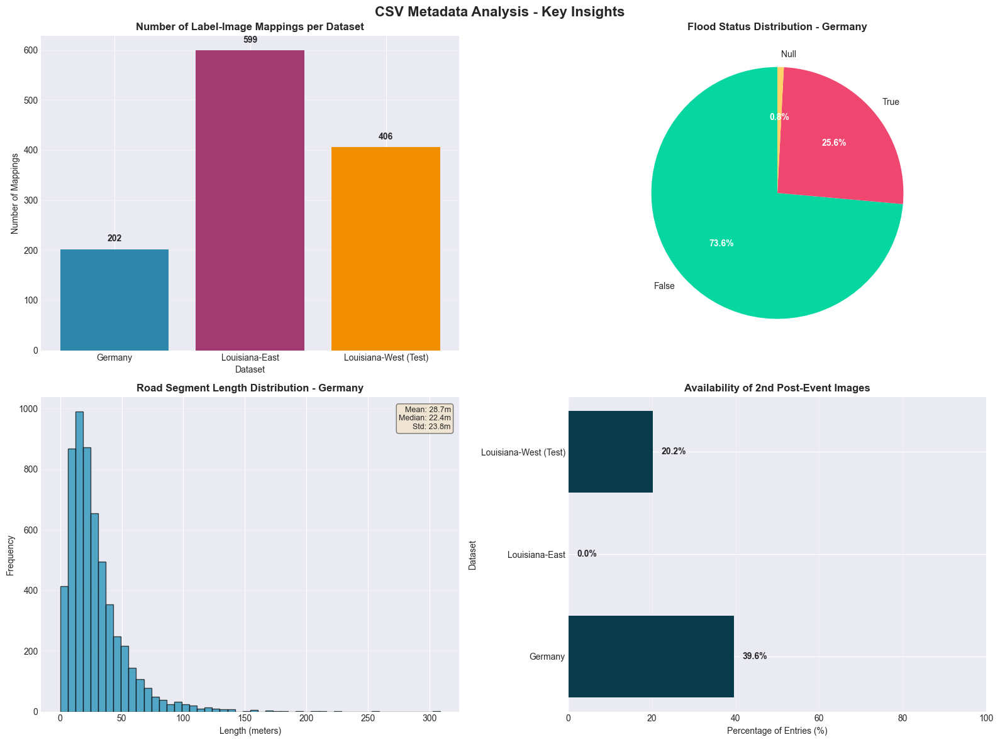

In [4]:
# Visualize CSV data insights
fig, axes = plt.subplots(2, 2, figsize=(16, 12))
fig.suptitle('CSV Metadata Analysis - Key Insights', fontsize=16, fontweight='bold')

# Plot 1: Dataset sizes (number of mappings)
ax1 = axes[0, 0]
dataset_names = []
mapping_counts = []
for dataset_name, data in csv_analysis.items():
    if 'mapping' in data:
        dataset_names.append(dataset_name)
        mapping_counts.append(data['mapping']['rows'])

bars1 = ax1.bar(dataset_names, mapping_counts, color=['#2E86AB', '#A23B72', '#F18F01'])
ax1.set_title('Number of Label-Image Mappings per Dataset', fontsize=12, fontweight='bold')
ax1.set_ylabel('Number of Mappings', fontsize=10)
ax1.set_xlabel('Dataset', fontsize=10)
ax1.grid(axis='y', alpha=0.3)
for i, (bar, count) in enumerate(zip(bars1, mapping_counts)):
    ax1.text(bar.get_x() + bar.get_width()/2, bar.get_height() + max(mapping_counts)*0.02, 
             f'{count:,}', ha='center', va='bottom', fontweight='bold', fontsize=10)

# Plot 2: Flood status distribution (if reference data exists)
ax2 = axes[0, 1]
flood_data_available = False
for dataset_name, data in csv_analysis.items():
    if 'reference' in data:
        df_ref = data['reference']['dataframe']
        if 'Flooded' in df_ref.columns:
            flood_counts = df_ref['Flooded'].value_counts()
            # Create pie chart
            colors = ['#06D6A0', '#EF476F', '#FFD166']
            wedges, texts, autotexts = ax2.pie(flood_counts.values, labels=flood_counts.index, 
                                                autopct='%1.1f%%', colors=colors[:len(flood_counts)],
                                                startangle=90, textprops={'fontsize': 10})
            for autotext in autotexts:
                autotext.set_color('white')
                autotext.set_fontweight('bold')
            ax2.set_title(f'Flood Status Distribution - {dataset_name}', fontsize=12, fontweight='bold')
            flood_data_available = True
            break

if not flood_data_available:
    ax2.text(0.5, 0.5, 'No flood reference data available', 
             ha='center', va='center', fontsize=12, transform=ax2.transAxes)
    ax2.set_title('Flood Status Distribution', fontsize=12, fontweight='bold')

# Plot 3: Road segment length distribution
ax3 = axes[1, 0]
length_data_available = False
for dataset_name, data in csv_analysis.items():
    if 'reference' in data:
        df_ref = data['reference']['dataframe']
        if 'length_m' in df_ref.columns:
            valid_lengths = df_ref['length_m'].dropna()
            if len(valid_lengths) > 0:
                ax3.hist(valid_lengths, bins=50, color='#118AB2', edgecolor='black', alpha=0.7)
                ax3.set_title(f'Road Segment Length Distribution - {dataset_name}', 
                             fontsize=12, fontweight='bold')
                ax3.set_xlabel('Length (meters)', fontsize=10)
                ax3.set_ylabel('Frequency', fontsize=10)
                ax3.grid(axis='y', alpha=0.3)
                
                # Add statistics text
                stats_text = f'Mean: {valid_lengths.mean():.1f}m\nMedian: {valid_lengths.median():.1f}m\nStd: {valid_lengths.std():.1f}m'
                ax3.text(0.98, 0.97, stats_text, transform=ax3.transAxes,
                        fontsize=9, verticalalignment='top', horizontalalignment='right',
                        bbox=dict(boxstyle='round', facecolor='wheat', alpha=0.5))
                length_data_available = True
                break

if not length_data_available:
    ax3.text(0.5, 0.5, 'No road length data available', 
             ha='center', va='center', fontsize=12, transform=ax3.transAxes)
    ax3.set_title('Road Segment Length Distribution', fontsize=12, fontweight='bold')

# Plot 4: Post-event image availability
ax4 = axes[1, 1]
datasets_with_post2 = []
post2_percentages = []

for dataset_name, data in csv_analysis.items():
    if 'mapping' in data:
        df_map = data['mapping']['dataframe']
        if 'post-event image 2' in df_map.columns:
            post2_count = df_map['post-event image 2'].notna().sum()
            post2_pct = (post2_count / len(df_map)) * 100
            datasets_with_post2.append(dataset_name)
            post2_percentages.append(post2_pct)

if datasets_with_post2:
    bars4 = ax4.barh(datasets_with_post2, post2_percentages, color='#073B4C')
    ax4.set_title('Availability of 2nd Post-Event Images', fontsize=12, fontweight='bold')
    ax4.set_xlabel('Percentage of Entries (%)', fontsize=10)
    ax4.set_ylabel('Dataset', fontsize=10)
    ax4.set_xlim(0, 100)
    ax4.grid(axis='x', alpha=0.3)
    for i, (bar, pct) in enumerate(zip(bars4, post2_percentages)):
        ax4.text(bar.get_width() + 2, bar.get_y() + bar.get_height()/2, 
                f'{pct:.1f}%', va='center', fontweight='bold', fontsize=10)
else:
    ax4.text(0.5, 0.5, 'No secondary post-event images', 
             ha='center', va='center', fontsize=12, transform=ax4.transAxes)
    ax4.set_title('Availability of 2nd Post-Event Images', fontsize=12, fontweight='bold')

plt.tight_layout()
plt.show()

### CSV-to-File Integrity Validation

Verify that all images and annotations referenced in CSV files actually exist on disk.

In [5]:
print("=" * 80)
print("CSV-TO-FILE INTEGRITY VALIDATION")
print("=" * 80)

integrity_results = {}

for dataset_name, dataset_path in [
    ("Germany", germany_path), 
    ("Louisiana-East", louisiana_east_path),
    ("Louisiana-West (Test)", louisiana_west_test_path)
]:
    if dataset_path.exists():
        print(f"\n{'='*60}")
        print(f"VALIDATING: {dataset_name}")
        print(f"{'='*60}")
        
        # Load mapping CSV if it exists
        mapping_csv = list(dataset_path.glob("*mapping.csv"))
        if not mapping_csv:
            print("  No mapping CSV found")
            continue
        
        df_mapping = pd.read_csv(mapping_csv[0])
        
        # Check existence of files
        missing_labels = []
        missing_pre = []
        missing_post1 = []
        missing_post2 = []
        
        # Define directories
        pre_dir = dataset_path / "PRE-event"
        post_dir = dataset_path / "POST-event"
        ann_dir = dataset_path / "annotations"
        
        for idx, row in df_mapping.iterrows():
            # Check label file
            label_file = ann_dir / row['label']
            if not label_file.exists():
                missing_labels.append(row['label'])
            
            # Check pre-event image
            pre_file = pre_dir / row['pre-event image']
            if not pre_file.exists():
                missing_pre.append(row['pre-event image'])
            
            # Check post-event image 1
            post1_file = post_dir / row['post-event image 1']
            if not post1_file.exists():
                missing_post1.append(row['post-event image 1'])
            
            # Check post-event image 2 (if it exists in CSV)
            if 'post-event image 2' in df_mapping.columns and pd.notna(row['post-event image 2']):
                post2_file = post_dir / row['post-event image 2']
                if not post2_file.exists():
                    missing_post2.append(row['post-event image 2'])
        
        # Calculate match rates
        total_entries = len(df_mapping)
        label_match_rate = (total_entries - len(missing_labels)) / total_entries * 100 if total_entries > 0 else 0
        pre_match_rate = (total_entries - len(missing_pre)) / total_entries * 100 if total_entries > 0 else 0
        post1_match_rate = (total_entries - len(missing_post1)) / total_entries * 100 if total_entries > 0 else 0
        
        # Store results
        integrity_results[dataset_name] = {
            "total_entries": total_entries,
            "missing_labels": len(missing_labels),
            "missing_pre": len(missing_pre),
            "missing_post1": len(missing_post1),
            "missing_post2": len(missing_post2),
            "label_match_rate": label_match_rate,
            "pre_match_rate": pre_match_rate,
            "post1_match_rate": post1_match_rate
        }
        
        # Print results
        print(f"\n  Integrity Check Results:")
        print(f"    Label files:           {total_entries - len(missing_labels):4d}/{total_entries} ({label_match_rate:5.1f}%)")
        print(f"    Pre-event images:      {total_entries - len(missing_pre):4d}/{total_entries} ({pre_match_rate:5.1f}%)")
        print(f"    Post-event images (1): {total_entries - len(missing_post1):4d}/{total_entries} ({post1_match_rate:5.1f}%)")
        if len(missing_post2) > 0:
            print(f"    Post-event images (2): Missing {len(missing_post2)} files")
        else:
            print(f"    Post-event images (2): All present (where specified)")
        
        # Show warnings for missing files
        if missing_labels:
            print(f"\n  WARNING: {len(missing_labels)} label files not found")
            for label in missing_labels[:5]:  # Show first 5
                print(f"    - {label}")
            if len(missing_labels) > 5:
                print(f"    ... and {len(missing_labels)-5} more")
        
        if missing_pre:
            print(f"\n  WARNING: {len(missing_pre)} pre-event images not found")
            for img in missing_pre[:5]:
                print(f"    - {img}")
            if len(missing_pre) > 5:
                print(f"    ... and {len(missing_pre)-5} more")
        
        if missing_post1:
            print(f"\n  WARNING: {len(missing_post1)} post-event images (1) not found")
            for img in missing_post1[:5]:
                print(f"    - {img}")
            if len(missing_post1) > 5:
                print(f"    ... and {len(missing_post1)-5} more")

print("\n" + "=" * 80)
print("Integrity validation complete")
print("=" * 80)

# Create summary dataframe
if integrity_results:
    integrity_df = pd.DataFrame(integrity_results).T
    print("\nIntegrity Summary:")
    print(integrity_df)

CSV-TO-FILE INTEGRITY VALIDATION

VALIDATING: Germany

  Integrity Check Results:
    Label files:            202/202 (100.0%)
    Pre-event images:       202/202 (100.0%)
    Post-event images (1):  202/202 (100.0%)
    Post-event images (2): All present (where specified)

VALIDATING: Louisiana-East

  Integrity Check Results:
    Label files:            599/599 (100.0%)
    Pre-event images:       599/599 (100.0%)
    Post-event images (1):  599/599 (100.0%)
    Post-event images (2): All present (where specified)

VALIDATING: Louisiana-West (Test)

  Integrity Check Results:
    Label files:              0/406 (  0.0%)
    Pre-event images:       406/406 (100.0%)
    Post-event images (1):  406/406 (100.0%)
    Post-event images (2): All present (where specified)

    - 0_35_12.geojson
    - 0_20_36.geojson
    - 0_13_26.geojson
    - 0_13_22.geojson
    - 0_17_17.geojson
    ... and 401 more

Integrity validation complete

Integrity Summary:
                       total_entries  mi

### CSV Summary Statistics & Insights

In [6]:
print("=" * 80)
print("CSV SUMMARY STATISTICS & KEY INSIGHTS")
print("=" * 80)

# Compile comprehensive statistics
csv_summary = {
    "total_datasets": len(csv_analysis),
    "total_mappings": 0,
    "total_road_segments": 0,
    "datasets_with_dual_post_images": 0,
    "flood_statistics": {},
    "road_length_statistics": {},
    "travel_time_statistics": {}
}

print("\nCross-Dataset Summary:")
print("-" * 60)

for dataset_name, data in csv_analysis.items():
    if 'mapping' in data:
        csv_summary['total_mappings'] += data['mapping']['rows']
        
        # Check for dual post-event images
        df_map = data['mapping']['dataframe']
        if 'post-event image 2' in df_map.columns:
            post2_count = df_map['post-event image 2'].notna().sum()
            if post2_count > 0:
                csv_summary['datasets_with_dual_post_images'] += 1
    
    if 'reference' in data:
        csv_summary['total_road_segments'] += data['reference']['rows']
        df_ref = data['reference']['dataframe']
        
        # Aggregate flood statistics
        if 'Flooded' in df_ref.columns:
            flood_counts = df_ref['Flooded'].value_counts()
            for status, count in flood_counts.items():
                if status not in csv_summary['flood_statistics']:
                    csv_summary['flood_statistics'][status] = 0
                csv_summary['flood_statistics'][status] += count
        
        # Aggregate road length statistics
        if 'length_m' in df_ref.columns:
            valid_lengths = df_ref['length_m'].dropna()
            if len(valid_lengths) > 0:
                if 'all_lengths' not in csv_summary['road_length_statistics']:
                    csv_summary['road_length_statistics']['all_lengths'] = []
                csv_summary['road_length_statistics']['all_lengths'].extend(valid_lengths.tolist())
        
        # Aggregate travel time statistics
        if 'travel_time_s' in df_ref.columns:
            valid_times = df_ref['travel_time_s'].dropna()
            if len(valid_times) > 0:
                if 'all_times' not in csv_summary['travel_time_statistics']:
                    csv_summary['travel_time_statistics']['all_times'] = []
                csv_summary['travel_time_statistics']['all_times'].extend(valid_times.tolist())

print(f"  Total datasets with CSV metadata: {csv_summary['total_datasets']}")
print(f"  Total label-image mappings: {csv_summary['total_mappings']:,}")
print(f"  Total road segments: {csv_summary['total_road_segments']:,}")
print(f"  Datasets with dual post-event images: {csv_summary['datasets_with_dual_post_images']}")

if csv_summary['flood_statistics']:
    print(f"\nFlood Impact Statistics:")
    print("-" * 60)
    total_flood_records = sum(csv_summary['flood_statistics'].values())
    for status, count in sorted(csv_summary['flood_statistics'].items(), key=lambda x: x[1], reverse=True):
        pct = (count / total_flood_records) * 100
        print(f"  {status:12s}: {count:6,} ({pct:5.1f}%)")

if 'all_lengths' in csv_summary['road_length_statistics']:
    all_lengths = np.array(csv_summary['road_length_statistics']['all_lengths'])
    print(f"\nRoad Segment Length Statistics:")
    print("-" * 60)
    print(f"  Total segments: {len(all_lengths):,}")
    print(f"  Mean length: {all_lengths.mean():.2f} meters")
    print(f"  Median length: {np.median(all_lengths):.2f} meters")
    print(f"  Std deviation: {all_lengths.std():.2f} meters")
    print(f"  Min length: {all_lengths.min():.2f} meters")
    print(f"  Max length: {all_lengths.max():.2f} meters")
    print(f"  Total network length: {all_lengths.sum():.2f} meters ({all_lengths.sum()/1000:.2f} km)")

if 'all_times' in csv_summary['travel_time_statistics']:
    all_times = np.array(csv_summary['travel_time_statistics']['all_times'])
    print(f"\nTravel Time Statistics:")
    print("-" * 60)
    print(f"  Total segments with time data: {len(all_times):,}")
    print(f"  Mean travel time: {all_times.mean():.2f} seconds")
    print(f"  Median travel time: {np.median(all_times):.2f} seconds")
    print(f"  Std deviation: {all_times.std():.2f} seconds")
    print(f"  Min travel time: {all_times.min():.2f} seconds")
    print(f"  Max travel time: {all_times.max():.2f} seconds")

print("\n" + "=" * 80)
print("KEY INSIGHTS FROM CSV ANALYSIS:")
print("=" * 80)

insights = []

# Insight 1: Mapping coverage
insights.append(f"Dataset provides {csv_summary['total_mappings']:,} label-to-image mappings across {csv_summary['total_datasets']} regions")

# Insight 2: Temporal coverage
if csv_summary['datasets_with_dual_post_images'] > 0:
    insights.append(f"{csv_summary['datasets_with_dual_post_images']} dataset(s) have multiple post-event images for temporal analysis")

# Insight 3: Flood impact
if csv_summary['flood_statistics']:
    total_flooded = csv_summary['flood_statistics'].get(True, 0) + csv_summary['flood_statistics'].get('True', 0)
    total_not_flooded = csv_summary['flood_statistics'].get(False, 0) + csv_summary['flood_statistics'].get('False', 0)
    if total_flooded > 0 and total_not_flooded > 0:
        flood_ratio = total_flooded / (total_flooded + total_not_flooded) * 100
        insights.append(f"Road network flood impact: {flood_ratio:.1f}% of segments affected")

# Insight 4: Network size
if 'all_lengths' in csv_summary['road_length_statistics']:
    total_km = sum(csv_summary['road_length_statistics']['all_lengths']) / 1000
    insights.append(f"Total road network length analyzed: {total_km:.2f} km across {len(csv_summary['road_length_statistics']['all_lengths']):,} segments")

# Insight 5: Data quality
if integrity_results:
    avg_integrity = np.mean([r['label_match_rate'] for r in integrity_results.values()])
    if avg_integrity >= 95:
        insights.append(f"High data integrity: {avg_integrity:.1f}% average match rate between CSV and files")
    else:
        insights.append(f"Data integrity issues detected: {avg_integrity:.1f}% average match rate")

for i, insight in enumerate(insights, 1):
    print(f"{i}. {insight}")

print("\n" + "=" * 80)

CSV SUMMARY STATISTICS & KEY INSIGHTS

Cross-Dataset Summary:
------------------------------------------------------------
  Total datasets with CSV metadata: 3
  Total label-image mappings: 1,207
  Total road segments: 33,424
  Datasets with dual post-event images: 2

Flood Impact Statistics:
------------------------------------------------------------
  False       : 26,077 ( 78.0%)
  True        :  7,075 ( 21.2%)
  Null        :    272 (  0.8%)

Road Segment Length Statistics:
------------------------------------------------------------
  Total segments: 16,512
  Mean length: 46.54 meters
  Median length: 29.25 meters
  Std deviation: 50.41 meters
  Min length: 0.01 meters
  Max length: 639.43 meters
  Total network length: 768434.55 meters (768.43 km)

Travel Time Statistics:
------------------------------------------------------------
  Total segments with time data: 16,512
  Mean travel time: 4.61 seconds
  Median travel time: 2.83 seconds
  Std deviation: 5.52 seconds
  Min trav

## 4. Image & Mask Property Analysis

In [7]:
# Deep analysis of image properties
print("=" * 80)
print("IMAGE & MASK PROPERTY ANALYSIS")
print("=" * 80)

image_analysis = {}

for dataset_name, dataset_path in [("Germany", germany_path), ("Louisiana-East", louisiana_east_path)]:
    if dataset_path.exists():
        print(f"\n{'='*60}")
        print(f"ANALYZING: {dataset_name}")
        print(f"{'='*60}")
        
        pre_dir = dataset_path / "PRE-event"
        post_dir = dataset_path / "POST-event"
        
        pre_images = sorted(list(pre_dir.glob("*.png")) + list(pre_dir.glob("*.tif")))
        post_images = sorted(list(post_dir.glob("*.png")) + list(post_dir.glob("*.tif")))
        
        if len(pre_images) > 0 and len(post_images) > 0:
            # Sample multiple images for statistics
            sample_size = min(10, len(pre_images))
            shapes = []
            dtypes = []
            value_ranges = []
            channel_stats = []
            file_sizes = []
            
            print(f"\nSampling {sample_size} images for analysis...")
            
            for i in range(sample_size):
                # Load images
                pre_img = np.array(Image.open(pre_images[i]))
                post_img = np.array(Image.open(post_images[i]))
                
                shapes.append(pre_img.shape)
                dtypes.append(str(pre_img.dtype))
                value_ranges.append((pre_img.min(), pre_img.max(), pre_img.mean(), pre_img.std()))
                file_sizes.append(pre_images[i].stat().st_size)
                
                # Channel-wise statistics
                if len(pre_img.shape) == 3:
                    channel_means = [pre_img[:,:,c].mean() for c in range(pre_img.shape[2])]
                    channel_stds = [pre_img[:,:,c].std() for c in range(pre_img.shape[2])]
                    channel_stats.append((channel_means, channel_stds))
            
            # Aggregate statistics
            unique_shapes = Counter([str(s) for s in shapes])
            unique_dtypes = Counter(dtypes)
            
            image_analysis[dataset_name] = {
                "num_samples_analyzed": sample_size,
                "total_images": len(pre_images),
                "shapes": dict(unique_shapes),
                "most_common_shape": shapes[0],
                "dtypes": dict(unique_dtypes),
                "value_ranges": {
                    "min": min([v[0] for v in value_ranges]),
                    "max": max([v[1] for v in value_ranges]),
                    "mean_avg": np.mean([v[2] for v in value_ranges]),
                    "std_avg": np.mean([v[3] for v in value_ranges])
                },
                "avg_file_size": np.mean(file_sizes),
                "total_pixels": shapes[0][0] * shapes[0][1] if len(shapes[0]) >= 2 else 0,
                "has_channels": len(shapes[0]) == 3,
                "num_channels": shapes[0][2] if len(shapes[0]) == 3 else 1
            }
            
            # Print detailed analysis
            print(f"\n  Image Properties:")
            print(f"    ├─ Total images: {len(pre_images)}")
            print(f"    ├─ Sample size: {sample_size}")
            print(f"    ├─ Common shape: {shapes[0]}")
            print(f"    ├─ Data type: {dtypes[0]}")
            print(f"    ├─ Dimensions: {shapes[0][0]}×{shapes[0][1]}")
            if len(shapes[0]) == 3:
                print(f"    ├─ Channels: {shapes[0][2]}")
            print(f"    ├─ Pixel count: {shapes[0][0] * shapes[0][1]:,}")
            print(f"    └─ Avg file size: {format_size(np.mean(file_sizes))}")
            
            print(f"\n  Value Statistics:")
            print(f"    ├─ Min value: {image_analysis[dataset_name]['value_ranges']['min']:.2f}")
            print(f"    ├─ Max value: {image_analysis[dataset_name]['value_ranges']['max']:.2f}")
            print(f"    ├─ Mean (avg): {image_analysis[dataset_name]['value_ranges']['mean_avg']:.2f}")
            print(f"    └─ Std (avg): {image_analysis[dataset_name]['value_ranges']['std_avg']:.2f}")
            
            if channel_stats and len(channel_stats[0][0]) > 0:
                print(f"\n  Channel Statistics (RGB):")
                avg_means = np.mean([cs[0] for cs in channel_stats], axis=0)
                avg_stds = np.mean([cs[1] for cs in channel_stats], axis=0)
                for c in range(len(avg_means)):
                    channel_name = ['Red', 'Green', 'Blue'][c] if c < 3 else f'Channel {c}'
                    print(f"    ├─ {channel_name:6} → Mean: {avg_means[c]:7.2f}, Std: {avg_stds[c]:7.2f}")
            
            # Check shape consistency
            if len(unique_shapes) > 1:
                print(f"\n  Multiple image shapes detected!")
                for shape, count in unique_shapes.items():
                    print(f"      - {shape}: {count} images")

print("\n" + "=" * 80)
print("Image property analysis complete")
print("=" * 80)

# Create summary DataFrame
summary_data = []
for dataset_name, analysis in image_analysis.items():
    summary_data.append({
        "Dataset": dataset_name,
        "Total Images": analysis['total_images'],
        "Shape": str(analysis['most_common_shape']),
        "Channels": analysis['num_channels'],
        "Dtype": list(analysis['dtypes'].keys())[0],
        "Value Range": f"{analysis['value_ranges']['min']:.0f}-{analysis['value_ranges']['max']:.0f}",
        "Mean": f"{analysis['value_ranges']['mean_avg']:.2f}",
        "Avg File Size": format_size(analysis['avg_file_size'])
    })

summary_df = pd.DataFrame(summary_data)
print("\nImage Analysis Summary:")
print(summary_df.to_string(index=False))
print("=" * 80)

IMAGE & MASK PROPERTY ANALYSIS

ANALYZING: Germany

Sampling 10 images for analysis...

  Image Properties:
    ├─ Total images: 202
    ├─ Sample size: 10
    ├─ Common shape: (1300, 1300, 3)
    ├─ Data type: uint8
    ├─ Dimensions: 1300×1300
    ├─ Channels: 3
    ├─ Pixel count: 1,690,000
    └─ Avg file size: 3.20 MB

  Value Statistics:
    ├─ Min value: 0.00
    ├─ Max value: 255.00
    ├─ Mean (avg): 59.53
    └─ Std (avg): 44.82

  Channel Statistics (RGB):
    ├─ Red    → Mean:   53.71, Std:   43.37
    ├─ Green  → Mean:   76.03, Std:   46.06
    ├─ Blue   → Mean:   48.86, Std:   39.18

ANALYZING: Louisiana-East

Sampling 10 images for analysis...

  Image Properties:
    ├─ Total images: 599
    ├─ Sample size: 10
    ├─ Common shape: (1300, 1300, 3)
    ├─ Data type: uint8
    ├─ Dimensions: 1300×1300
    ├─ Channels: 3
    ├─ Pixel count: 1,690,000
    └─ Avg file size: 4.49 MB

  Value Statistics:
    ├─ Min value: 0.00
    ├─ Max value: 255.00
    ├─ Mean (avg): 61.98
 

## 5. Class Distribution Analysis

CLASS DISTRIBUTION ANALYSIS - GEOJSON ANNOTATIONS

Germany Dataset:
------------------------------------------------------------
  Loaded 4952 features from 202 files

  Available columns: ['id', 'building', 'flooded', 'highway', 'lanes', 'surface', 'oneway', 'bridge', 'layer', 'tunnel', 'type', 'image_id', 'location', 'tile_id', 'geometry_type']

  Column: 'type'
  Value                             Count   Percentage
  ----------------------------------------------------

  Column: 'geometry_type'
  Value                             Count   Percentage
  ----------------------------------------------------
  Polygon                           3,972       80.21%
  LineString                          929       18.76%
  MultiLineString                      37        0.75%
  MultiPolygon                         14        0.28%

  Geometry Types:
    - Polygon          3,972 ( 80.2%)
    - LineString         929 ( 18.8%)
    - MultiLineString     37 (  0.7%)
    - MultiPolygon        14 (  0

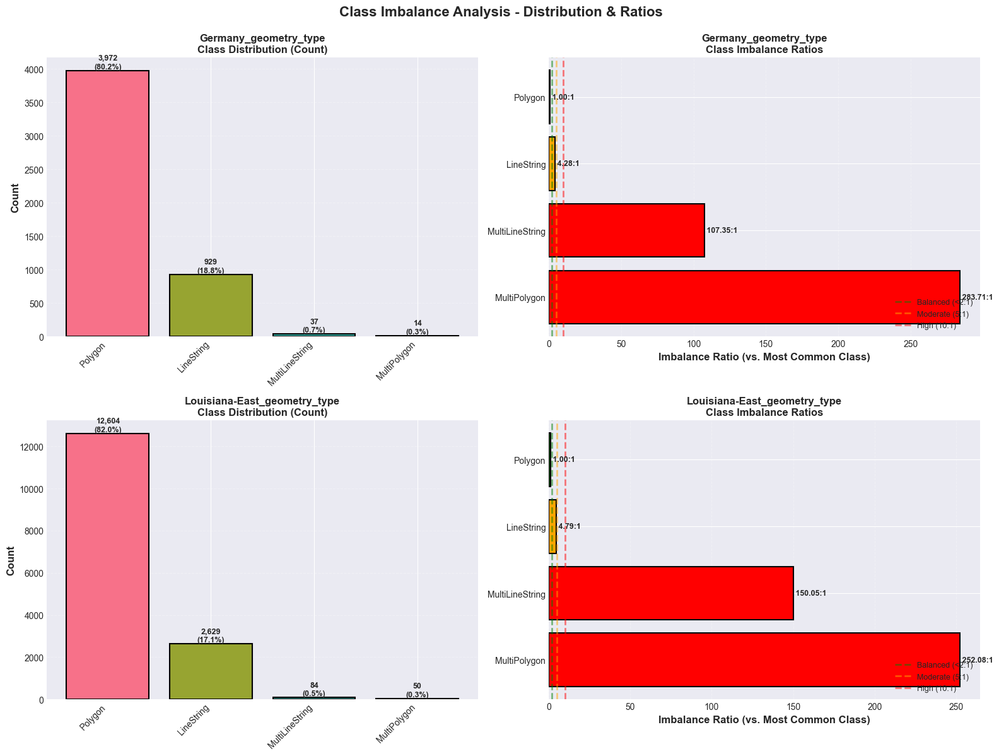

In [8]:
# Comprehensive class distribution analysis from GeoJSON annotations
print("=" * 80)
print("CLASS DISTRIBUTION ANALYSIS - GEOJSON ANNOTATIONS")
print("=" * 80)

def load_geojson_annotations(annotation_path):
    """Load GeoJSON annotations and extract feature properties"""
    annotations = []
    if annotation_path.exists():
        for geojson_file in sorted(annotation_path.glob("*.geojson")):
            try:
                with open(geojson_file, 'r') as f:
                    geojson_data = json.load(f)
                    for feature in geojson_data.get('features', []):
                        props = feature.get('properties', {})
                        props['tile_id'] = geojson_file.stem
                        props['geometry_type'] = feature.get('geometry', {}).get('type', 'unknown')
                        annotations.append(props)
            except Exception as e:
                print(f"  ERROR: loading {geojson_file.name}: {e}")
    return pd.DataFrame(annotations)

# Load annotations from Germany and Louisiana-East
annotation_data = {}
class_distributions = {}

for dataset_name, dataset_path in [("Germany", germany_path), ("Louisiana-East", louisiana_east_path)]:
    ann_path = dataset_path / "annotations"
    if ann_path.exists():
        print(f"\n{dataset_name} Dataset:")
        print("-" * 60)
        
        df = load_geojson_annotations(ann_path)
        annotation_data[dataset_name] = df
        
        print(f"  Loaded {len(df)} features from {len(list(ann_path.glob('*.geojson')))} files")
        
        if len(df) > 0:
            print(f"\n  Available columns: {list(df.columns)}")
            
            # Analyze different class-related columns
            for col in df.columns:
                if 'class' in col.lower() or 'damage' in col.lower() or 'type' in col.lower():
                    print(f"\n  Column: '{col}'")
                    value_counts = df[col].value_counts()
                    total = len(df)
                    
                    class_distributions[f"{dataset_name}_{col}"] = value_counts.to_dict()
                    
                    print(f"  {'Value':<30} {'Count':>8} {'Percentage':>12}")
                    print("  " + "-" * 52)
                    for val, count in value_counts.items():
                        pct = 100 * count / total
                        print(f"  {str(val):<30} {count:>8,} {pct:>11.2f}%")
            
            # Geometry type distribution
            if 'geometry_type' in df.columns:
                print(f"\n  Geometry Types:")
                for geom_type, count in df['geometry_type'].value_counts().items():
                    pct = 100 * count / len(df)
                    print(f"    - {geom_type:15} {count:6,} ({pct:5.1f}%)")
            
            # Sample data
            print(f"\n  Sample annotations:")
            print(df.head(3).to_string(index=False))
        else:
            print("  No features found in annotations")

print("\n" + "=" * 80)
print("Class distribution analysis complete")
print("=" * 80)

# Calculate class imbalance metrics
print("\nClass Imbalance Metrics:")
print("-" * 60)

imbalance_metrics = {}

for key, distribution in class_distributions.items():
    if distribution:
        counts = list(distribution.values())
        max_count = max(counts)
        min_count = min(counts)
        imbalance_ratio = max_count / min_count if min_count > 0 else float('inf')
        
        imbalance_metrics[key] = {
            'max_count': max_count,
            'min_count': min_count,
            'ratio': imbalance_ratio,
            'distribution': distribution
        }
        
        print(f"\n{key}:")
        print(f"  Most common class count: {max_count:,}")
        print(f"  Least common class count: {min_count:,}")
        print(f"  Imbalance ratio: {imbalance_ratio:.2f}:1")
        
        if imbalance_ratio > 10:
            print(f"HIGH IMBALANCE - Consider class weighting or resampling")
        elif imbalance_ratio > 5:
            print(f"MODERATE IMBALANCE - May benefit from class weighting")
        else:
            print(f"Relatively balanced")

print("=" * 80)

# Visualize class imbalance
if class_distributions:
    # Filter out distributions with only 1 class or empty distributions
    valid_distributions = {k: v for k, v in class_distributions.items() if v and len(v) > 1}
    
    if valid_distributions:
        num_distributions = len(valid_distributions)
        fig, axes = plt.subplots(num_distributions, 2, figsize=(16, 6 * num_distributions))
        
        # Ensure axes is always 2D
        if num_distributions == 1:
            axes = axes.reshape(1, -1)
        
        fig.suptitle('Class Imbalance Analysis - Distribution & Ratios', fontsize=16, fontweight='bold', y=0.995)
        
        for idx, (key, distribution) in enumerate(valid_distributions.items()):
            # Sort by count (descending)
            sorted_items = sorted(distribution.items(), key=lambda x: x[1], reverse=True)
            labels = [str(item[0]) for item in sorted_items]
            counts = [item[1] for item in sorted_items]
            
            # Left plot: Bar chart of class distribution
            colors = sns.color_palette("husl", len(labels))
            axes[idx, 0].bar(range(len(labels)), counts, color=colors, edgecolor='black', linewidth=1.5)
            axes[idx, 0].set_xticks(range(len(labels)))
            axes[idx, 0].set_xticklabels(labels, rotation=45, ha='right')
            axes[idx, 0].set_ylabel('Count', fontweight='bold', fontsize=12)
            axes[idx, 0].set_title(f'{key}\nClass Distribution (Count)', fontweight='bold', fontsize=12)
            axes[idx, 0].grid(axis='y', alpha=0.3, linestyle='--')
            
            # Add count labels on bars
            for i, (label, count) in enumerate(zip(labels, counts)):
                pct = 100 * count / sum(counts)
                axes[idx, 0].text(i, count, f'{count:,}\n({pct:.1f}%)', 
                                 ha='center', va='bottom', fontweight='bold', fontsize=9)
            
            # Right plot: Imbalance ratio visualization
            if len(counts) > 0:
                max_count = max(counts)
                ratios = [max_count / count if count > 0 else 0 for count in counts]
                
                colors_ratio = ['darkgreen' if r < 2 else 'orange' if r < 5 else 'red' for r in ratios]
                bars = axes[idx, 1].barh(range(len(labels)), ratios, color=colors_ratio, edgecolor='black', linewidth=1.5)
                axes[idx, 1].set_yticks(range(len(labels)))
                axes[idx, 1].set_yticklabels(labels)
                axes[idx, 1].set_xlabel('Imbalance Ratio (vs. Most Common Class)', fontweight='bold', fontsize=12)
                axes[idx, 1].set_title(f'{key}\nClass Imbalance Ratios', fontweight='bold', fontsize=12)
                axes[idx, 1].grid(axis='x', alpha=0.3, linestyle='--')
                axes[idx, 1].invert_yaxis()
                
                # Add ratio labels on bars
                for i, (label, ratio) in enumerate(zip(labels, ratios)):
                    axes[idx, 1].text(ratio, i, f' {ratio:.2f}:1', 
                                     ha='left', va='center', fontweight='bold', fontsize=9)
                
                # Add reference lines
                axes[idx, 1].axvline(x=2, color='green', linestyle='--', alpha=0.5, linewidth=2, label='Balanced (<2:1)')
                axes[idx, 1].axvline(x=5, color='orange', linestyle='--', alpha=0.5, linewidth=2, label='Moderate (5:1)')
                axes[idx, 1].axvline(x=10, color='red', linestyle='--', alpha=0.5, linewidth=2, label='High (10:1)')
                axes[idx, 1].legend(loc='lower right', fontsize=9)
        
        plt.tight_layout()
        plt.show()
    else:
        print("\nNo valid class distributions with multiple classes found for visualization")
else:
    print("\nNo class distributions available for visualization")

print("=" * 80)

## 6. Advanced Visualizations - Pixel-Level Statistics

PIXEL-LEVEL STATISTICAL ANALYSIS


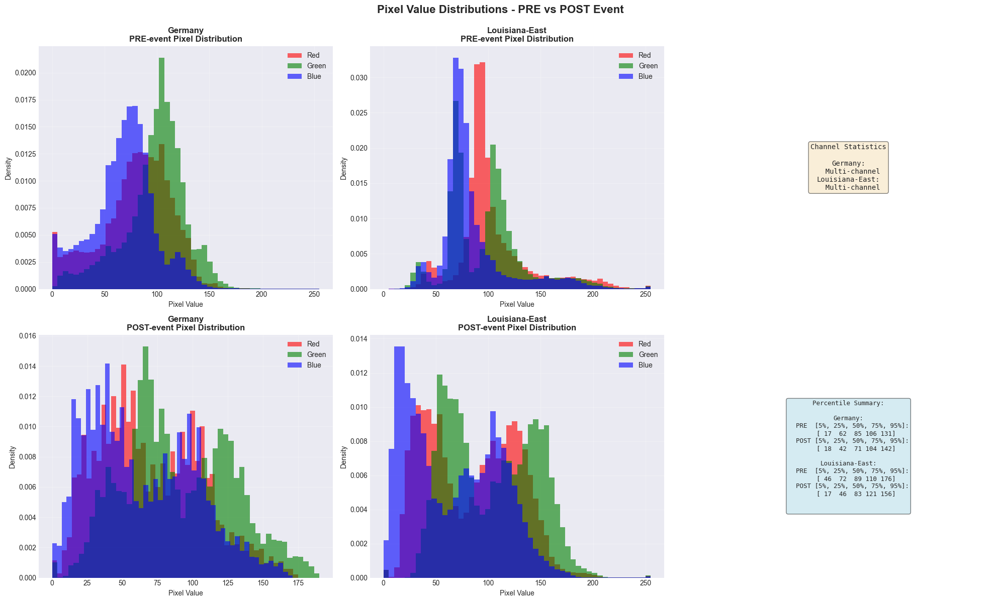

Pixel distribution analysis complete


In [9]:
# Pixel-level statistical analysis with distributions
print("=" * 80)
print("PIXEL-LEVEL STATISTICAL ANALYSIS")
print("=" * 80)

fig, axes = plt.subplots(2, 3, figsize=(20, 12))
fig.suptitle('Pixel Value Distributions - PRE vs POST Event', fontsize=16, fontweight='bold', y=0.995)

dataset_list = [
    ("Germany", germany_path),
    ("Louisiana-East", louisiana_east_path)
]

pixel_statistics = {}

for col_idx, (dataset_name, dataset_path) in enumerate(dataset_list):
    if dataset_path.exists():
        pre_dir = dataset_path / "PRE-event"
        post_dir = dataset_path / "POST-event"
        
        pre_files = sorted(list(pre_dir.glob("*.png")) + list(pre_dir.glob("*.tif")))
        post_files = sorted(list(post_dir.glob("*.png")) + list(post_dir.glob("*.tif")))
        
        if len(pre_files) > 0 and len(post_files) > 0:
            # Sample images for pixel statistics
            sample_idx = np.random.randint(0, min(len(pre_files), len(post_files)))
            
            pre_img = np.array(Image.open(pre_files[sample_idx]))
            post_img = np.array(Image.open(post_files[sample_idx]))
            
            # Normalize if needed
            if pre_img.dtype == np.uint16:
                pre_img = (pre_img / 65535.0 * 255).astype(np.uint8)
            if post_img.dtype == np.uint16:
                post_img = (post_img / 65535.0 * 255).astype(np.uint8)
            
            # Flatten for histogram
            if len(pre_img.shape) == 3:
                pre_flat = pre_img.reshape(-1, pre_img.shape[2])
                post_flat = post_img.reshape(-1, post_img.shape[2])
            else:
                pre_flat = pre_img.reshape(-1, 1)
                post_flat = post_img.reshape(-1, 1)
            
            # Plot histograms for each channel
            colors = ['red', 'green', 'blue'] if pre_flat.shape[1] == 3 else ['gray']
            
            for channel in range(min(3, pre_flat.shape[1])):
                # PRE histogram
                axes[0, col_idx].hist(pre_flat[:, channel], bins=50, alpha=0.6, 
                                      color=colors[channel], label=f'{colors[channel].capitalize()}',
                                      density=True)
                axes[0, col_idx].set_title(f'{dataset_name}\nPRE-event Pixel Distribution', fontweight='bold')
                axes[0, col_idx].set_xlabel('Pixel Value')
                axes[0, col_idx].set_ylabel('Density')
                axes[0, col_idx].legend()
                axes[0, col_idx].grid(alpha=0.3)
                
                # POST histogram
                axes[1, col_idx].hist(post_flat[:, channel], bins=50, alpha=0.6, 
                                      color=colors[channel], label=f'{colors[channel].capitalize()}',
                                      density=True)
                axes[1, col_idx].set_title(f'{dataset_name}\nPOST-event Pixel Distribution', fontweight='bold')
                axes[1, col_idx].set_xlabel('Pixel Value')
                axes[1, col_idx].set_ylabel('Density')
                axes[1, col_idx].legend()
                axes[1, col_idx].grid(alpha=0.3)
            
            # Collect statistics
            pixel_statistics[dataset_name] = {
                'pre_mean': pre_img.mean(axis=(0,1)) if len(pre_img.shape) == 3 else pre_img.mean(),
                'pre_std': pre_img.std(axis=(0,1)) if len(pre_img.shape) == 3 else pre_img.std(),
                'post_mean': post_img.mean(axis=(0,1)) if len(post_img.shape) == 3 else post_img.mean(),
                'post_std': post_img.std(axis=(0,1)) if len(post_img.shape) == 3 else post_img.std(),
                'pre_percentiles': np.percentile(pre_img, [5, 25, 50, 75, 95]),
                'post_percentiles': np.percentile(post_img, [5, 25, 50, 75, 95])
            }

# Add correlation plot in the third column
ax_corr = axes[0, 2]
ax_corr.axis('off')
ax_corr.text(0.5, 0.5, 'Channel Statistics\n\n' + 
             '\n'.join([f"{k}:\n  PRE: μ={v['pre_mean']:.1f}, σ={v['pre_std']:.1f}\n  POST: μ={v['post_mean']:.1f}, σ={v['post_std']:.1f}" 
                       if isinstance(v['pre_mean'], (int, float)) else f"{k}:\n  Multi-channel"
                       for k, v in pixel_statistics.items()]),
             ha='center', va='center', fontsize=10, family='monospace',
             bbox=dict(boxstyle='round', facecolor='wheat', alpha=0.5))

ax_stats = axes[1, 2]
ax_stats.axis('off')
percentile_text = "Percentile Summary:\n\n"
for name, stats in pixel_statistics.items():
    percentile_text += f"{name}:\n"
    percentile_text += f"  PRE  [5%, 25%, 50%, 75%, 95%]:\n    {stats['pre_percentiles'].astype(int)}\n"
    percentile_text += f"  POST [5%, 25%, 50%, 75%, 95%]:\n    {stats['post_percentiles'].astype(int)}\n\n"

ax_stats.text(0.5, 0.5, percentile_text,
              ha='center', va='center', fontsize=9, family='monospace',
              bbox=dict(boxstyle='round', facecolor='lightblue', alpha=0.5))

plt.tight_layout()
plt.show()

print("Pixel distribution analysis complete")
print("=" * 80)

## 7. Temporal Change Detection & Difference Analysis

TEMPORAL CHANGE DETECTION - PRE vs POST ANALYSIS
Germany: Shape mismatch detected - PRE: (1300, 1300, 3), POST: (1742, 1743, 3)
Resized POST to match PRE: (1300, 1300, 3)
Louisiana-East: Shape mismatch detected - PRE: (1300, 1300, 3), POST: (1114, 1114, 3)
Resized POST to match PRE: (1300, 1300, 3)


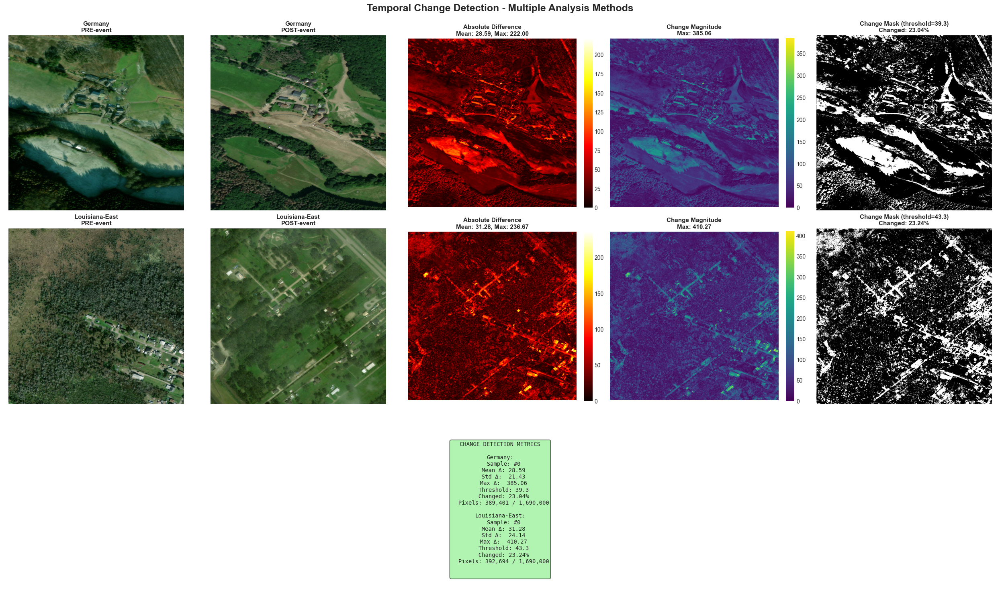

Temporal change detection complete

Change Metrics Summary:
  Germany (Sample #0):
    - Average change: 28.59 ± 21.43
    - Max change: 385.06
    - Changed area: 23.04%
    - Total difference: 0
  Louisiana-East (Sample #0):
    - Average change: 31.28 ± 24.14
    - Max change: 410.27
    - Changed area: 23.24%
    - Total difference: 0


In [10]:
# Comprehensive temporal change detection analysis
print("=" * 80)
print("TEMPORAL CHANGE DETECTION - PRE vs POST ANALYSIS")
print("=" * 80)

fig, axes = plt.subplots(3, 5, figsize=(25, 15))
fig.suptitle('Temporal Change Detection - Multiple Analysis Methods', fontsize=18, fontweight='bold', y=0.995)

dataset_list = [
    ("Germany", germany_path),
    ("Louisiana-East", louisiana_east_path)
]

change_metrics = {}

for row_base, (dataset_name, dataset_path) in enumerate(dataset_list):
    if dataset_path.exists():
        pre_dir = dataset_path / "PRE-event"
        post_dir = dataset_path / "POST-event"
        
        pre_files = sorted(list(pre_dir.glob("*.png")) + list(pre_dir.glob("*.tif")))
        post_files = sorted(list(post_dir.glob("*.png")) + list(post_dir.glob("*.tif")))
        
        if len(pre_files) > 0 and len(post_files) > 0:
            # Try multiple samples to find one with changes
            max_samples_to_try = min(10, len(pre_files))
            best_sample_idx = 0
            max_diff = 0
            
            # Quick scan to find image pair with most changes
            for test_idx in range(max_samples_to_try):
                try:
                    test_pre = np.array(Image.open(pre_files[test_idx])).astype(float)
                    test_post = np.array(Image.open(post_files[test_idx])).astype(float)
                    
                    if test_pre.shape == test_post.shape:
                        diff_sum = np.abs(test_pre - test_post).sum()
                        if diff_sum > max_diff:
                            max_diff = diff_sum
                            best_sample_idx = test_idx
                except Exception:
                    continue
            
            sample_idx = best_sample_idx
            
            pre_img = np.array(Image.open(pre_files[sample_idx])).astype(float)
            post_img = np.array(Image.open(post_files[sample_idx])).astype(float)
            
            # Handle shape mismatch by resizing
            if pre_img.shape != post_img.shape:
                print(f"{dataset_name}: Shape mismatch detected - PRE: {pre_img.shape}, POST: {post_img.shape}")
                # Resize POST to match PRE
                post_img_pil = Image.fromarray(post_img.astype(np.uint8) if post_img.max() <= 255 else (post_img / post_img.max() * 255).astype(np.uint8))
                post_img_pil = post_img_pil.resize((pre_img.shape[1], pre_img.shape[0]), Image.Resampling.LANCZOS)
                post_img = np.array(post_img_pil).astype(float)
                print(f"Resized POST to match PRE: {post_img.shape}")
            
            # Normalize to 0-255 range
            if pre_img.max() > 255:
                pre_img = pre_img / pre_img.max() * 255
            if post_img.max() > 255:
                post_img = post_img / post_img.max() * 255
            
            row = row_base
            
            # 1. PRE image
            axes[row, 0].imshow(pre_img.astype(np.uint8))
            axes[row, 0].set_title(f'{dataset_name}\nPRE-event', fontweight='bold', fontsize=11)
            axes[row, 0].axis('off')
            
            # 2. POST image
            axes[row, 1].imshow(post_img.astype(np.uint8))
            axes[row, 1].set_title(f'{dataset_name}\nPOST-event', fontweight='bold', fontsize=11)
            axes[row, 1].axis('off')
            
            # 3. Absolute difference
            if pre_img.shape == post_img.shape:
                if len(pre_img.shape) == 3:
                    diff_abs = np.abs(pre_img - post_img).mean(axis=2)
                else:
                    diff_abs = np.abs(pre_img - post_img)
                
                # Use adaptive vmax for better visualization
                diff_vmax = max(diff_abs.max(), 10)  # Ensure minimum range
                im = axes[row, 2].imshow(diff_abs, cmap='hot', vmin=0, vmax=diff_vmax)
                axes[row, 2].set_title(f'Absolute Difference\nMean: {diff_abs.mean():.2f}, Max: {diff_abs.max():.2f}', 
                                       fontweight='bold', fontsize=11)
                axes[row, 2].axis('off')
                plt.colorbar(im, ax=axes[row, 2], fraction=0.046, pad=0.04)
                
                # 4. Change magnitude (normalized)
                change_mag = np.linalg.norm(pre_img - post_img, axis=2) if len(pre_img.shape) == 3 else diff_abs
                im = axes[row, 3].imshow(change_mag, cmap='viridis')
                axes[row, 3].set_title(f'Change Magnitude\nMax: {change_mag.max():.2f}', 
                                       fontweight='bold', fontsize=11)
                axes[row, 3].axis('off')
                plt.colorbar(im, ax=axes[row, 3], fraction=0.046, pad=0.04)
                
                # 5. Binary change mask (adaptive threshold)
                # Use more sensitive threshold
                threshold = diff_abs.mean() + 0.5 * diff_abs.std()  # More sensitive
                if threshold < 5:  # Minimum threshold
                    threshold = 5
                    
                change_mask = (diff_abs > threshold).astype(np.uint8) * 255
                axes[row, 4].imshow(change_mask, cmap='gray')
                changed_pixels = np.sum(change_mask > 0)
                total_pixels = change_mask.size
                change_pct = 100 * changed_pixels / total_pixels
                axes[row, 4].set_title(f'Change Mask (threshold={threshold:.1f})\nChanged: {change_pct:.2f}%', 
                                       fontweight='bold', fontsize=11)
                axes[row, 4].axis('off')
                
                # Collect metrics
                change_metrics[dataset_name] = {
                    'mean_abs_diff': diff_abs.mean(),
                    'std_abs_diff': diff_abs.std(),
                    'max_change': change_mag.max(),
                    'change_percentage': change_pct,
                    'changed_pixels': int(changed_pixels),
                    'total_pixels': int(total_pixels),
                    'threshold_used': threshold,
                    'sample_index': sample_idx,
                    'total_diff': max_diff
                }
            else:
                # Shape mismatch - display warning
                axes[row, 2].text(0.5, 0.5, 'Shape Mismatch\nCannot compute difference',
                                 ha='center', va='center', fontsize=12, color='red',
                                 bbox=dict(boxstyle='round', facecolor='yellow', alpha=0.7))
                axes[row, 2].set_xlim(0, 1)
                axes[row, 2].set_ylim(0, 1)
                axes[row, 2].axis('off')
                
                axes[row, 3].axis('off')
                axes[row, 4].axis('off')

# Add summary in third row
axes[2, 0].axis('off')
axes[2, 1].axis('off')
axes[2, 2].axis('off')
axes[2, 3].axis('off')
axes[2, 4].axis('off')

summary_text = "CHANGE DETECTION METRICS\n\n"
if change_metrics:
    for name, metrics in change_metrics.items():
        summary_text += f"{name}:\n"
        summary_text += f"  Sample: #{metrics.get('sample_index', 'N/A')}\n"
        summary_text += f"  Mean Δ: {metrics['mean_abs_diff']:.2f}\n"
        summary_text += f"  Std Δ:  {metrics['std_abs_diff']:.2f}\n"
        summary_text += f"  Max Δ:  {metrics['max_change']:.2f}\n"
        summary_text += f"  Threshold: {metrics.get('threshold_used', 0):.1f}\n"
        summary_text += f"  Changed: {metrics['change_percentage']:.2f}%\n"
        summary_text += f"  Pixels: {metrics['changed_pixels']:,} / {metrics['total_pixels']:,}\n\n"
else:
    summary_text += "No change metrics computed.\nCheck that datasets have matching\nPRE/POST image pairs."

axes[2, 2].text(0.5, 0.5, summary_text,
                ha='center', va='center', fontsize=10, family='monospace',
                bbox=dict(boxstyle='round', facecolor='lightgreen', alpha=0.7))

plt.tight_layout()
plt.show()

print("Temporal change detection complete")

if change_metrics:
    print("\nChange Metrics Summary:")
    for name, metrics in change_metrics.items():
        print(f"  {name} (Sample #{metrics.get('sample_index', 'N/A')}):")
        print(f"    - Average change: {metrics['mean_abs_diff']:.2f} ± {metrics['std_abs_diff']:.2f}")
        print(f"    - Max change: {metrics['max_change']:.2f}")
        print(f"    - Changed area: {metrics['change_percentage']:.2f}%")
        print(f"    - Total difference: {metrics.get('total_diff', 0):,.0f}")
else:
    print("\nNo change metrics computed - check data availability")
    
print("=" * 80)

## 8. Edge Detection & Boundary Analysis

EDGE DETECTION & BOUNDARY ANALYSIS


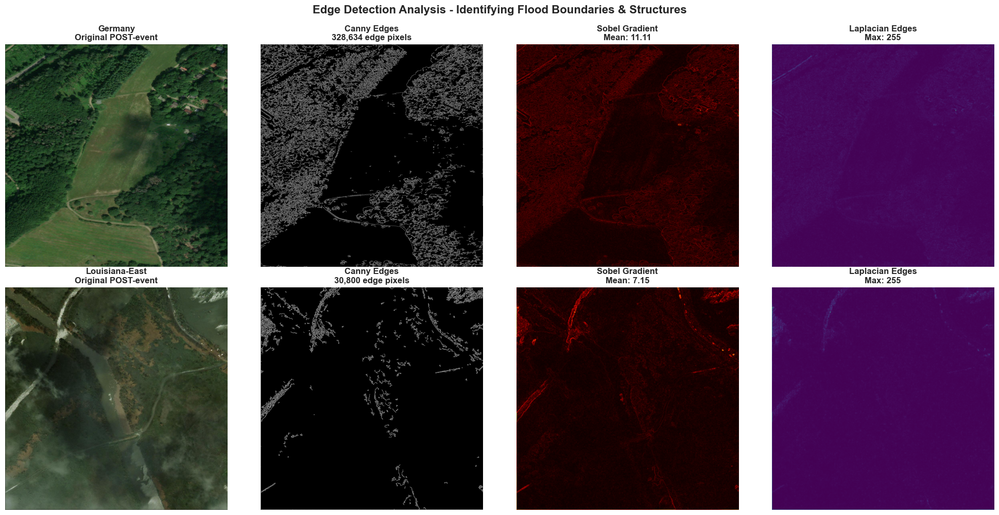

Edge detection analysis complete
aved to: D:\Personal\AI-Admissions\Semester4\AAI-521-Applied Computer Vision for AI\Final Team Project\aai521_3proj\outputs\samples\edge_detection_analysis.png

Edge Detection Methods Applied:
  1. Canny - Good for precise boundary detection
  2. Sobel - Captures gradient magnitude and direction
  3. Laplacian - Sensitive to rapid intensity changes


In [11]:
# Edge detection analysis for flood boundaries and structure identification
print("=" * 80)
print("EDGE DETECTION & BOUNDARY ANALYSIS")
print("=" * 80)

fig, axes = plt.subplots(2, 4, figsize=(20, 10))
fig.suptitle('Edge Detection Analysis - Identifying Flood Boundaries & Structures', 
             fontsize=16, fontweight='bold', y=0.995)

for row_idx, (dataset_name, dataset_path) in enumerate([("Germany", germany_path), ("Louisiana-East", louisiana_east_path)]):
    if dataset_path.exists():
        pre_dir = dataset_path / "PRE-event"
        post_dir = dataset_path / "POST-event"
        
        pre_files = sorted(list(pre_dir.glob("*.png")) + list(pre_dir.glob("*.tif")))
        post_files = sorted(list(post_dir.glob("*.png")) + list(post_dir.glob("*.tif")))
        
        if len(pre_files) > 0 and len(post_files) > 0:
            # Load sample
            sample_idx = min(3, len(pre_files) - 1)
            post_img = np.array(Image.open(post_files[sample_idx]))
            
            # Convert to grayscale if needed
            if len(post_img.shape) == 3:
                gray = cv2.cvtColor(post_img, cv2.COLOR_RGB2GRAY)
            else:
                gray = post_img
            
            # Normalize if needed
            if gray.dtype == np.uint16:
                gray = (gray / gray.max() * 255).astype(np.uint8)
            elif gray.max() <= 1.0:
                gray = (gray * 255).astype(np.uint8)
            
            # 1. Original POST image
            axes[row_idx, 0].imshow(post_img, cmap='gray' if len(post_img.shape) == 2 else None)
            axes[row_idx, 0].set_title(f'{dataset_name}\nOriginal POST-event', fontweight='bold')
            axes[row_idx, 0].axis('off')
            
            # 2. Canny edge detection
            edges_canny = cv2.Canny(gray, 50, 150)
            axes[row_idx, 1].imshow(edges_canny, cmap='gray')
            axes[row_idx, 1].set_title(f'Canny Edges\n{np.sum(edges_canny > 0):,} edge pixels', fontweight='bold')
            axes[row_idx, 1].axis('off')
            
            # 3. Sobel edge detection (gradient magnitude)
            sobelx = cv2.Sobel(gray, cv2.CV_64F, 1, 0, ksize=3)
            sobely = cv2.Sobel(gray, cv2.CV_64F, 0, 1, ksize=3)
            sobel_mag = np.sqrt(sobelx**2 + sobely**2)
            sobel_mag = ((sobel_mag / sobel_mag.max()) * 255).astype(np.uint8)
            
            axes[row_idx, 2].imshow(sobel_mag, cmap='hot')
            axes[row_idx, 2].set_title(f'Sobel Gradient\nMean: {sobel_mag.mean():.2f}', fontweight='bold')
            axes[row_idx, 2].axis('off')
            
            # 4. Laplacian edge detection
            laplacian = cv2.Laplacian(gray, cv2.CV_64F)
            laplacian = np.absolute(laplacian)
            laplacian = ((laplacian / laplacian.max()) * 255).astype(np.uint8)
            
            axes[row_idx, 3].imshow(laplacian, cmap='viridis')
            axes[row_idx, 3].set_title(f'Laplacian Edges\nMax: {laplacian.max()}', fontweight='bold')
            axes[row_idx, 3].axis('off')

plt.tight_layout()
plt.show()

print("Edge detection analysis complete")
print(f"aved to: {SAMPLE_OUTPUTS_DIR / 'edge_detection_analysis.png'}")
print("\nEdge Detection Methods Applied:")
print("  1. Canny - Good for precise boundary detection")
print("  2. Sobel - Captures gradient magnitude and direction")
print("  3. Laplacian - Sensitive to rapid intensity changes")
print("=" * 80)

## 9. Geospatial Analysis - Interactive Flood Mapping

GEOSPATIAL ANALYSIS - FLOOD IMPACT MAPPING

Germany Dataset:
------------------------------------------------------------
  Extracted 4,200 coordinate points
  Bounding box: X(6.91, 6.96), Y(50.47, 50.52)
  Center point: (6.94, 50.50)
  Total geometries: 605

Louisiana-East Dataset:
------------------------------------------------------------
  Extracted 6,051 coordinate points
  Bounding box: X(-90.02, -89.98), Y(29.64, 29.75)
  Center point: (-90.00, 29.72)
  Total geometries: 1087



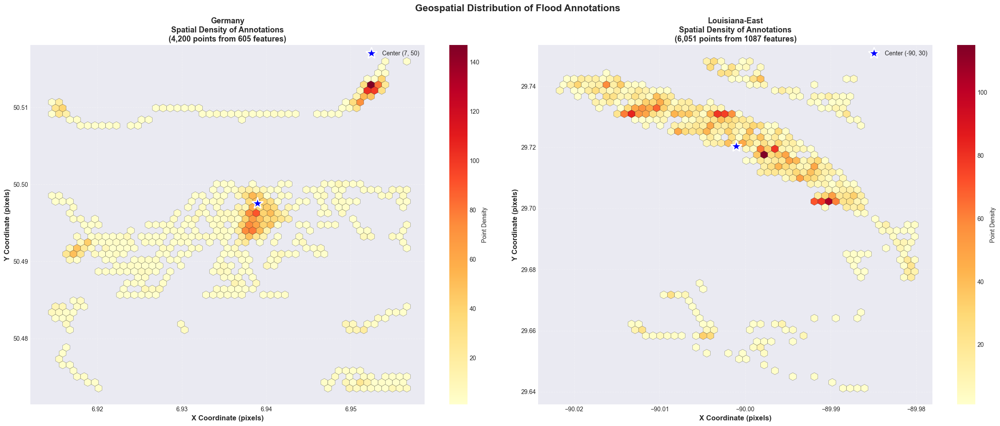


Generating interactive folium maps...
  • Germany: Coordinates are in pixel space (not lat/lon)
    For true geospatial mapping, coordinate reference system (CRS) transformation needed


In [12]:
# Geospatial analysis with interactive maps and coordinate-based clustering
print("=" * 80)
print("GEOSPATIAL ANALYSIS - FLOOD IMPACT MAPPING")
print("=" * 80)

# Extract geospatial coordinates from GeoJSON files
geospatial_data = {}

for dataset_name, dataset_path in [("Germany", germany_path), ("Louisiana-East", louisiana_east_path)]:
    ann_path = dataset_path / "annotations"
    if ann_path.exists():
        print(f"\n{dataset_name} Dataset:")
        print("-" * 60)
        
        all_coords = []
        all_geometries = []
        all_properties = []
        
        for geojson_file in sorted(list(ann_path.glob("*.geojson"))[:50]):  # Sample first 50
            try:
                with open(geojson_file, 'r') as f:
                    geojson_data = json.load(f)
                    for feature in geojson_data.get('features', []):
                        geom = feature.get('geometry', {})
                        coords = geom.get('coordinates', [])
                        geom_type = geom.get('type', 'unknown')
                        
                        # Extract coordinates based on geometry type
                        if geom_type == 'Polygon' and coords:
                            # Polygon: coords is [[[x, y], [x, y], ...]]
                            for ring in coords:
                                all_coords.extend(ring)
                        elif geom_type == 'LineString' and coords:
                            # LineString: coords is [[x, y], [x, y], ...]
                            all_coords.extend(coords)
                        elif geom_type == 'MultiPolygon' and coords:
                            # MultiPolygon: coords is [[[[x, y], ...]], ...]
                            for polygon in coords:
                                for ring in polygon:
                                    all_coords.extend(ring)
                        elif geom_type == 'MultiLineString' and coords:
                            # MultiLineString: coords is [[[x, y], ...], ...]
                            for line in coords:
                                all_coords.extend(line)
                        
                        all_geometries.append({
                            'type': geom_type,
                            'tile_id': geojson_file.stem,
                            'properties': feature.get('properties', {})
                        })
            except Exception as e:
                print(f"  ERROR: processing {geojson_file.name}: {e}")
        
        if all_coords:
            coords_array = np.array(all_coords)
            
            geospatial_data[dataset_name] = {
                'coordinates': coords_array,
                'geometries': all_geometries,
                'bounds': {
                    'min_x': coords_array[:, 0].min(),
                    'max_x': coords_array[:, 0].max(),
                    'min_y': coords_array[:, 1].min(),
                    'max_y': coords_array[:, 1].max()
                },
                'center': {
                    'x': coords_array[:, 0].mean(),
                    'y': coords_array[:, 1].mean()
                }
            }
            
            print(f"  Extracted {len(coords_array):,} coordinate points")
            print(f"  Bounding box: X({geospatial_data[dataset_name]['bounds']['min_x']:.2f}, "
                  f"{geospatial_data[dataset_name]['bounds']['max_x']:.2f}), "
                  f"Y({geospatial_data[dataset_name]['bounds']['min_y']:.2f}, "
                  f"{geospatial_data[dataset_name]['bounds']['max_y']:.2f})")
            print(f"  Center point: ({geospatial_data[dataset_name]['center']['x']:.2f}, "
                  f"{geospatial_data[dataset_name]['center']['y']:.2f})")
            print(f"  Total geometries: {len(all_geometries)}")

print("\n" + "=" * 80)

# Visualization: Coordinate scatter plots with density
if geospatial_data:
    fig, axes = plt.subplots(1, len(geospatial_data), figsize=(12 * len(geospatial_data), 10))
    
    if len(geospatial_data) == 1:
        axes = [axes]
    
    fig.suptitle('Geospatial Distribution of Flood Annotations', fontsize=16, fontweight='bold', y=0.98)
    
    for idx, (dataset_name, data) in enumerate(geospatial_data.items()):
        coords = data['coordinates']
        
        # Create 2D histogram for density
        h = axes[idx].hexbin(coords[:, 0], coords[:, 1], gridsize=50, cmap='YlOrRd', 
                            mincnt=1, edgecolors='black', linewidths=0.2)
        
        axes[idx].set_xlabel('X Coordinate (pixels)', fontweight='bold', fontsize=12)
        axes[idx].set_ylabel('Y Coordinate (pixels)', fontweight='bold', fontsize=12)
        axes[idx].set_title(f'{dataset_name}\nSpatial Density of Annotations\n'
                           f'({len(coords):,} points from {len(data["geometries"])} features)',
                           fontweight='bold', fontsize=13)
        
        plt.colorbar(h, ax=axes[idx], label='Point Density')
        axes[idx].grid(alpha=0.3, linestyle='--')
        
        # Mark center
        center = data['center']
        axes[idx].plot(center['x'], center['y'], 'b*', markersize=20, 
                      label=f'Center ({center["x"]:.0f}, {center["y"]:.0f})', 
                      markeredgecolor='white', markeredgewidth=2)
        axes[idx].legend(loc='upper right', fontsize=10)
    
    plt.tight_layout()
    plt.show()

# Interactive map (if geospatial libraries available)
if HAS_GEOSPATIAL and geospatial_data:
    print("\nGenerating interactive folium maps...")
    
    for dataset_name, data in list(geospatial_data.items())[:1]:  # Create map for first dataset
        # Note: These are pixel coordinates, not lat/lon
        # For demonstration, we'll create a coordinate-based visualization
        print(f"  • {dataset_name}: Coordinates are in pixel space (not lat/lon)")
        print(f"    For true geospatial mapping, coordinate reference system (CRS) transformation needed")

print("=" * 80)

## 10. 3D Visualization - Intensity & Change Surfaces

3D SURFACE VISUALIZATION - INTENSITY & CHANGE PATTERNS

Germany:
  3D surfaces created from (130, 130) downsampled grid
  Mean intensity - PRE: 55.46, POST: 58.17
  Change magnitude - Mean: 27.52, Max: 134.33

Louisiana-East:
  3D surfaces created from (130, 130) downsampled grid
  Mean intensity - PRE: 54.80, POST: 70.44
  Change magnitude - Mean: 47.47, Max: 240.33


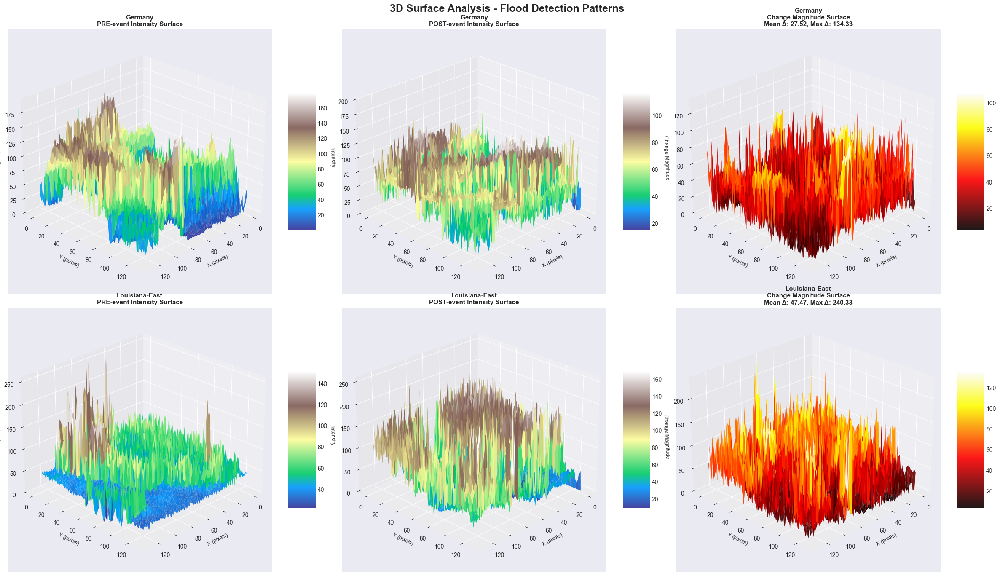


✓ 3D surface visualization complete


In [ ]:
# 3D surface plots for pixel intensity and change magnitude analysis
print("=" * 80)
print("3D SURFACE VISUALIZATION - INTENSITY & CHANGE PATTERNS")
print("=" * 80)

from mpl_toolkits.mplot3d import Axes3D

fig = plt.figure(figsize=(24, 14))
fig.suptitle('3D Surface Analysis - Flood Detection Patterns', fontsize=18, fontweight='bold')

plot_idx = 1

for dataset_name, dataset_path in [("Germany", germany_path), ("Louisiana-East", louisiana_east_path)]:
    if dataset_path.exists():
        pre_dir = dataset_path / "PRE-event"
        post_dir = dataset_path / "POST-event"
        
        pre_files = sorted(list(pre_dir.glob("*.png")) + list(pre_dir.glob("*.tif")))
        post_files = sorted(list(post_dir.glob("*.png")) + list(post_dir.glob("*.tif")))
        
        if len(pre_files) > 0 and len(post_files) > 0:
            # Load sample images
            sample_idx = min(2, len(pre_files) - 1)
            
            pre_img = np.array(Image.open(pre_files[sample_idx])).astype(float)
            post_img = np.array(Image.open(post_files[sample_idx])).astype(float)
            
            # Handle shape mismatch
            if pre_img.shape != post_img.shape:
                post_img_pil = Image.fromarray(post_img.astype(np.uint8) if post_img.max() <= 255 
                                               else (post_img / post_img.max() * 255).astype(np.uint8))
                post_img_pil = post_img_pil.resize((pre_img.shape[1], pre_img.shape[0]), Image.Resampling.LANCZOS)
                post_img = np.array(post_img_pil).astype(float)
            
            # Normalize
            if pre_img.max() > 255:
                pre_img = pre_img / pre_img.max() * 255
            if post_img.max() > 255:
                post_img = post_img / post_img.max() * 255
            
            # Convert to grayscale for 3D visualization
            if len(pre_img.shape) == 3:
                pre_gray = np.mean(pre_img, axis=2)
                post_gray = np.mean(post_img, axis=2)
            else:
                pre_gray = pre_img
                post_gray = post_img
            
            # Downsample for visualization performance (every 10th pixel)
            downsample_factor = 10
            pre_down = pre_gray[::downsample_factor, ::downsample_factor]
            post_down = post_gray[::downsample_factor, ::downsample_factor]
            
            # Calculate change magnitude
            change_mag = np.abs(post_down - pre_down)
            
            # Create meshgrid
            x = np.arange(0, pre_down.shape[1])
            y = np.arange(0, pre_down.shape[0])
            X, Y = np.meshgrid(x, y)
            
            # Plot 1: PRE-event 3D surface
            ax1 = fig.add_subplot(2, 3, plot_idx, projection='3d')
            surf1 = ax1.plot_surface(X, Y, pre_down, cmap='terrain', 
                                     linewidth=0, antialiased=True, alpha=0.9)
            ax1.set_title(f'{dataset_name}\nPRE-event Intensity Surface', 
                         fontweight='bold', fontsize=11)
            ax1.set_xlabel('X (pixels)', fontsize=9)
            ax1.set_ylabel('Y (pixels)', fontsize=9)
            ax1.set_zlabel('Intensity', fontsize=9)
            ax1.view_init(elev=25, azim=45)
            fig.colorbar(surf1, ax=ax1, shrink=0.5, aspect=5)
            
            # Plot 2: POST-event 3D surface
            ax2 = fig.add_subplot(2, 3, plot_idx + 1, projection='3d')
            surf2 = ax2.plot_surface(X, Y, post_down, cmap='terrain', 
                                     linewidth=0, antialiased=True, alpha=0.9)
            ax2.set_title(f'{dataset_name}\nPOST-event Intensity Surface', 
                         fontweight='bold', fontsize=11)
            ax2.set_xlabel('X (pixels)', fontsize=9)
            ax2.set_ylabel('Y (pixels)', fontsize=9)
            ax2.set_zlabel('Intensity', fontsize=9)
            ax2.view_init(elev=25, azim=45)
            fig.colorbar(surf2, ax=ax2, shrink=0.5, aspect=5)
            
            # Plot 3: Change magnitude 3D surface
            ax3 = fig.add_subplot(2, 3, plot_idx + 2, projection='3d')
            surf3 = ax3.plot_surface(X, Y, change_mag, cmap='hot', 
                                     linewidth=0, antialiased=True, alpha=0.9)
            ax3.set_title(f'{dataset_name}\nChange Magnitude Surface\n'
                         f'Mean Δ: {change_mag.mean():.2f}, Max Δ: {change_mag.max():.2f}', 
                         fontweight='bold', fontsize=11)
            ax3.set_xlabel('X (pixels)', fontsize=9)
            ax3.set_ylabel('Y (pixels)', fontsize=9)
            ax3.set_zlabel('Change Magnitude', fontsize=9)
            ax3.view_init(elev=25, azim=45)
            fig.colorbar(surf3, ax=ax3, shrink=0.5, aspect=5)
            
            plot_idx += 3
            
            print(f"\n{dataset_name}:")
            print(f"  3D surfaces created from {pre_down.shape} downsampled grid")
            print(f"  Mean intensity - PRE: {pre_down.mean():.2f}, POST: {post_down.mean():.2f}")
            print(f"  Change magnitude - Mean: {change_mag.mean():.2f}, Max: {change_mag.max():.2f}")

plt.tight_layout()
plt.show()

print("\n3D surface visualization complete")
print("=" * 80)

## 11. Texture Analysis - GLCM & Frequency Domain

TEXTURE & FREQUENCY ANALYSIS - FLOOD vs NON-FLOOD PATTERNS

Germany Texture Metrics:
  GLCM Features:
    ├─ Contrast:      24.5923 (higher = more local variation)
    ├─ Dissimilarity: 3.6849
    ├─ Homogeneity:   0.2561 (higher = more uniform)
    ├─ Energy:        0.0432 (higher = more ordered)
    └─ Correlation:   0.9232
  LBP Entropy: 2.8738 (texture complexity)
  FFT Magnitude: 6.01 ± 1.10

Louisiana-East Texture Metrics:
  GLCM Features:
    ├─ Contrast:      65.3493 (higher = more local variation)
    ├─ Dissimilarity: 5.4948
    ├─ Homogeneity:   0.2018 (higher = more uniform)
    ├─ Energy:        0.0295 (higher = more ordered)
    └─ Correlation:   0.8927
  LBP Entropy: 3.1509 (texture complexity)
  FFT Magnitude: 6.26 ± 1.14


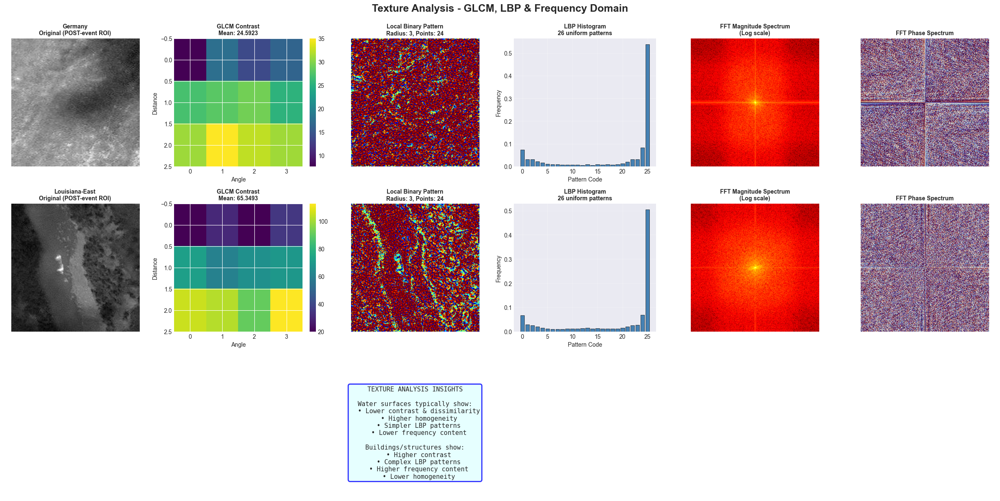


Texture analysis complete


In [14]:
# Texture analysis using GLCM features and FFT frequency analysis
print("=" * 80)
print("TEXTURE & FREQUENCY ANALYSIS - FLOOD vs NON-FLOOD PATTERNS")
print("=" * 80)

from skimage.feature import graycomatrix, graycoprops, local_binary_pattern

fig, axes = plt.subplots(3, 6, figsize=(24, 12))
fig.suptitle('Texture Analysis - GLCM, LBP & Frequency Domain', fontsize=18, fontweight='bold', y=0.995)

texture_metrics = {}

for row_idx, (dataset_name, dataset_path) in enumerate([("Germany", germany_path), ("Louisiana-East", louisiana_east_path)]):
    if dataset_path.exists():
        post_dir = dataset_path / "POST-event"
        post_files = sorted(list(post_dir.glob("*.png")) + list(post_dir.glob("*.tif")))
        
        if len(post_files) > 0:
            # Load sample image
            sample_idx = min(3, len(post_files) - 1)
            img = np.array(Image.open(post_files[sample_idx]))
            
            # Convert to grayscale
            if len(img.shape) == 3:
                gray = cv2.cvtColor(img, cv2.COLOR_RGB2GRAY)
            else:
                gray = img
            
            # Normalize to 0-255
            if gray.dtype == np.uint16:
                gray = (gray / 65535.0 * 255).astype(np.uint8)
            elif gray.max() <= 1.0:
                gray = (gray * 255).astype(np.uint8)
            
            # Take a region of interest (center crop for faster computation)
            h, w = gray.shape
            roi_size = min(256, h, w)
            start_h, start_w = (h - roi_size) // 2, (w - roi_size) // 2
            roi = gray[start_h:start_h + roi_size, start_w:start_w + roi_size]
            
            # 1. Original image
            axes[row_idx, 0].imshow(roi, cmap='gray')
            axes[row_idx, 0].set_title(f'{dataset_name}\nOriginal (POST-event ROI)', fontweight='bold', fontsize=10)
            axes[row_idx, 0].axis('off')
            
            # 2. GLCM Contrast
            # Compute GLCM (Gray Level Co-occurrence Matrix)
            distances = [1, 3, 5]
            angles = [0, np.pi/4, np.pi/2, 3*np.pi/4]
            glcm = graycomatrix(roi, distances=distances, angles=angles, levels=256, 
                               symmetric=True, normed=True)
            
            # Calculate texture properties
            contrast = graycoprops(glcm, 'contrast').mean()
            dissimilarity = graycoprops(glcm, 'dissimilarity').mean()
            homogeneity = graycoprops(glcm, 'homogeneity').mean()
            energy = graycoprops(glcm, 'energy').mean()
            correlation = graycoprops(glcm, 'correlation').mean()
            
            # Visualize contrast as heatmap
            contrast_map = graycoprops(glcm, 'contrast')
            im = axes[row_idx, 1].imshow(contrast_map, cmap='viridis', aspect='auto')
            axes[row_idx, 1].set_title(f'GLCM Contrast\nMean: {contrast:.4f}', fontweight='bold', fontsize=10)
            axes[row_idx, 1].set_xlabel('Angle')
            axes[row_idx, 1].set_ylabel('Distance')
            plt.colorbar(im, ax=axes[row_idx, 1], fraction=0.046)
            
            # 3. Local Binary Pattern (LBP)
            radius = 3
            n_points = 8 * radius
            lbp = local_binary_pattern(roi, n_points, radius, method='uniform')
            
            axes[row_idx, 2].imshow(lbp, cmap='jet')
            axes[row_idx, 2].set_title(f'Local Binary Pattern\nRadius: {radius}, Points: {n_points}', 
                                      fontweight='bold', fontsize=10)
            axes[row_idx, 2].axis('off')
            
            # 4. LBP Histogram
            n_bins = int(lbp.max() + 1)
            hist, _ = np.histogram(lbp.ravel(), bins=n_bins, range=(0, n_bins), density=True)
            axes[row_idx, 3].bar(range(n_bins), hist, color='steelblue', edgecolor='black', linewidth=0.5)
            axes[row_idx, 3].set_title(f'LBP Histogram\n{n_bins} uniform patterns', fontweight='bold', fontsize=10)
            axes[row_idx, 3].set_xlabel('Pattern Code')
            axes[row_idx, 3].set_ylabel('Frequency')
            axes[row_idx, 3].grid(alpha=0.3)
            
            # 5. FFT (Frequency Domain)
            fft = np.fft.fft2(roi)
            fft_shift = np.fft.fftshift(fft)
            magnitude_spectrum = np.log(np.abs(fft_shift) + 1)
            
            axes[row_idx, 4].imshow(magnitude_spectrum, cmap='hot')
            axes[row_idx, 4].set_title(f'FFT Magnitude Spectrum\n(Log scale)', fontweight='bold', fontsize=10)
            axes[row_idx, 4].axis('off')
            
            # 6. FFT Phase
            phase_spectrum = np.angle(fft_shift)
            axes[row_idx, 5].imshow(phase_spectrum, cmap='twilight')
            axes[row_idx, 5].set_title(f'FFT Phase Spectrum', fontweight='bold', fontsize=10)
            axes[row_idx, 5].axis('off')
            
            # Calculate entropy manually
            lbp_entropy = -np.sum(hist * np.log2(hist + 1e-10))
            
            # Store metrics
            texture_metrics[dataset_name] = {
                'glcm_contrast': float(contrast),
                'glcm_dissimilarity': float(dissimilarity),
                'glcm_homogeneity': float(homogeneity),
                'glcm_energy': float(energy),
                'glcm_correlation': float(correlation),
                'lbp_entropy': float(lbp_entropy),
                'fft_mean_magnitude': float(magnitude_spectrum.mean()),
                'fft_std_magnitude': float(magnitude_spectrum.std())
            }
            
            print(f"\n{dataset_name} Texture Metrics:")
            print(f"  GLCM Features:")
            print(f"    ├─ Contrast:      {contrast:.4f} (higher = more local variation)")
            print(f"    ├─ Dissimilarity: {dissimilarity:.4f}")
            print(f"    ├─ Homogeneity:   {homogeneity:.4f} (higher = more uniform)")
            print(f"    ├─ Energy:        {energy:.4f} (higher = more ordered)")
            print(f"    └─ Correlation:   {correlation:.4f}")
            print(f"  LBP Entropy: {texture_metrics[dataset_name]['lbp_entropy']:.4f} (texture complexity)")
            print(f"  FFT Magnitude: {magnitude_spectrum.mean():.2f} ± {magnitude_spectrum.std():.2f}")

# Add summary in third row
for col in range(6):
    axes[2, col].axis('off')

summary_text = "TEXTURE ANALYSIS INSIGHTS\n\n"
summary_text += "Water surfaces typically show:\n"
summary_text += "  • Lower contrast & dissimilarity\n"
summary_text += "  • Higher homogeneity\n"
summary_text += "  • Simpler LBP patterns\n"
summary_text += "  • Lower frequency content\n\n"
summary_text += "Buildings/structures show:\n"
summary_text += "  • Higher contrast\n"
summary_text += "  • Complex LBP patterns\n"
summary_text += "  • Higher frequency content\n"
summary_text += "  • Lower homogeneity"

axes[2, 2].text(0.5, 0.5, summary_text, ha='center', va='center', 
               fontsize=11, family='monospace',
               bbox=dict(boxstyle='round', facecolor='lightcyan', alpha=0.8, edgecolor='blue', linewidth=2))

plt.tight_layout()
plt.show()

print("\nTexture analysis complete")
print("=" * 80)

## 12. Color Space Analysis - Water Detection Signatures

COLOR SPACE ANALYSIS - WATER SIGNATURE DETECTION

Germany Color Space Metrics:
  RGB Means: R=43.85, G=66.67, B=39.72
  HSV Means: H=58.04, S=122.17, V=66.75
  Water Index: 0.2735 ± 0.1700
  HSV Water Detection: 0.85% of pixels
  Dominant Hue: 60°

Louisiana-East Color Space Metrics:
  RGB Means: R=56.21, G=66.33, B=47.09
  HSV Means: H=47.19, S=78.16, V=66.55
  Water Index: 0.0897 ± 0.0452
  HSV Water Detection: 0.00% of pixels
  Dominant Hue: 48°


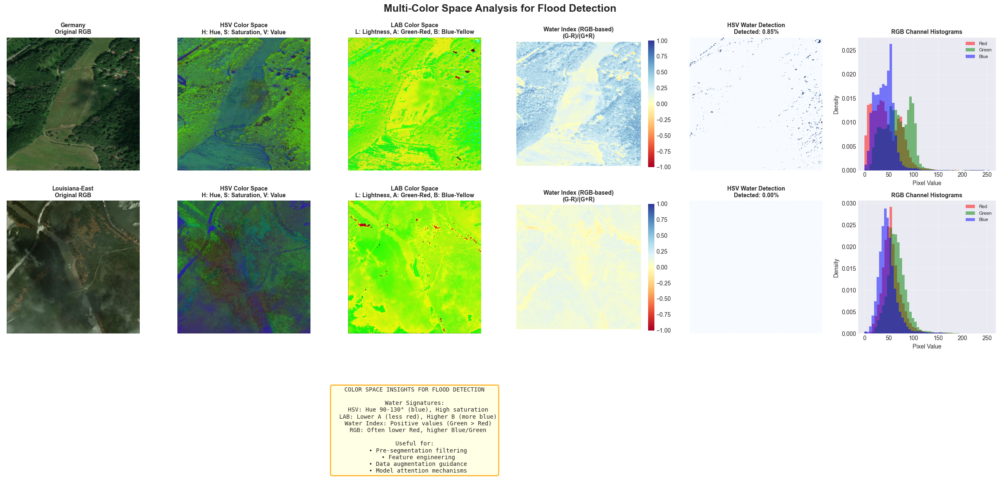


Color space analysis complete


In [15]:
# Multi-color space analysis for water detection
print("=" * 80)
print("COLOR SPACE ANALYSIS - WATER SIGNATURE DETECTION")
print("=" * 80)

fig, axes = plt.subplots(3, 6, figsize=(24, 12))
fig.suptitle('Multi-Color Space Analysis for Flood Detection', fontsize=18, fontweight='bold', y=0.995)

color_space_metrics = {}

for row_idx, (dataset_name, dataset_path) in enumerate([("Germany", germany_path), ("Louisiana-East", louisiana_east_path)]):
    if dataset_path.exists():
        post_dir = dataset_path / "POST-event"
        post_files = sorted(list(post_dir.glob("*.png")) + list(post_dir.glob("*.tif")))
        
        if len(post_files) > 0:
            # Load sample image
            sample_idx = min(3, len(post_files) - 1)
            img = np.array(Image.open(post_files[sample_idx]))
            
            # Ensure RGB
            if len(img.shape) == 2:
                img = cv2.cvtColor(img, cv2.COLOR_GRAY2RGB)
            
            # Normalize to 0-255
            if img.dtype == np.uint16:
                img = (img / 65535.0 * 255).astype(np.uint8)
            elif img.max() <= 1.0:
                img = (img * 255).astype(np.uint8)
            
            # 1. Original RGB
            axes[row_idx, 0].imshow(img)
            axes[row_idx, 0].set_title(f'{dataset_name}\nOriginal RGB', fontweight='bold', fontsize=10)
            axes[row_idx, 0].axis('off')
            
            # 2. HSV Color Space
            hsv = cv2.cvtColor(img, cv2.COLOR_RGB2HSV)
            axes[row_idx, 1].imshow(hsv)
            axes[row_idx, 1].set_title(f'HSV Color Space\nH: Hue, S: Saturation, V: Value', 
                                      fontweight='bold', fontsize=10)
            axes[row_idx, 1].axis('off')
            
            # 3. LAB Color Space
            lab = cv2.cvtColor(img, cv2.COLOR_RGB2LAB)
            # Normalize LAB for visualization
            lab_vis = lab.copy()
            lab_vis[:,:,0] = lab[:,:,0] * 255.0 / 100.0  # L channel
            lab_vis[:,:,1] = lab[:,:,1] + 128  # A channel
            lab_vis[:,:,2] = lab[:,:,2] + 128  # B channel
            axes[row_idx, 2].imshow(lab_vis.astype(np.uint8))
            axes[row_idx, 2].set_title(f'LAB Color Space\nL: Lightness, A: Green-Red, B: Blue-Yellow', 
                                      fontweight='bold', fontsize=10)
            axes[row_idx, 2].axis('off')
            
            # 4. Water Index (RGB-based NDWI approximation)
            # NDWI typically uses (Green - NIR) / (Green + NIR)
            # For RGB, we approximate with (Green - Red) / (Green + Red)
            R = img[:,:,0].astype(float)
            G = img[:,:,1].astype(float)
            B = img[:,:,2].astype(float)
            
            water_index = np.zeros_like(R)
            denominator = G + R
            mask = denominator > 0
            water_index[mask] = (G[mask] - R[mask]) / (G[mask] + R[mask])
            
            im = axes[row_idx, 3].imshow(water_index, cmap='RdYlBu', vmin=-1, vmax=1)
            axes[row_idx, 3].set_title(f'Water Index (RGB-based)\n(G-R)/(G+R)', 
                                      fontweight='bold', fontsize=10)
            axes[row_idx, 3].axis('off')
            plt.colorbar(im, ax=axes[row_idx, 3], fraction=0.046)
            
            # 5. HSV-based water detection (Blue-ish, high saturation)
            h_channel = hsv[:,:,0]
            s_channel = hsv[:,:,1]
            v_channel = hsv[:,:,2]
            
            # Water typically: Hue in blue range (90-130), moderate-high saturation
            water_mask_hsv = ((h_channel >= 90) & (h_channel <= 130) & (s_channel > 50)).astype(np.uint8) * 255
            
            axes[row_idx, 4].imshow(water_mask_hsv, cmap='Blues')
            water_pixels = np.sum(water_mask_hsv > 0)
            total_pixels = water_mask_hsv.size
            water_pct = 100 * water_pixels / total_pixels
            axes[row_idx, 4].set_title(f'HSV Water Detection\nDetected: {water_pct:.2f}%', 
                                      fontweight='bold', fontsize=10)
            axes[row_idx, 4].axis('off')
            
            # 6. Multi-channel histogram
            axes[row_idx, 5].hist(R.ravel(), bins=50, alpha=0.5, color='red', label='Red', density=True)
            axes[row_idx, 5].hist(G.ravel(), bins=50, alpha=0.5, color='green', label='Green', density=True)
            axes[row_idx, 5].hist(B.ravel(), bins=50, alpha=0.5, color='blue', label='Blue', density=True)
            axes[row_idx, 5].set_title(f'RGB Channel Histograms', fontweight='bold', fontsize=10)
            axes[row_idx, 5].set_xlabel('Pixel Value')
            axes[row_idx, 5].set_ylabel('Density')
            axes[row_idx, 5].legend(fontsize=8)
            axes[row_idx, 5].grid(alpha=0.3)
            
            # Collect metrics
            color_space_metrics[dataset_name] = {
                'rgb_mean': [float(R.mean()), float(G.mean()), float(B.mean())],
                'rgb_std': [float(R.std()), float(G.std()), float(B.std())],
                'hsv_mean': [float(h_channel.mean()), float(s_channel.mean()), float(v_channel.mean())],
                'hsv_std': [float(h_channel.std()), float(s_channel.std()), float(v_channel.std())],
                'water_index_mean': float(water_index.mean()),
                'water_index_std': float(water_index.std()),
                'water_percentage_hsv': float(water_pct),
                'dominant_hue': int(np.median(h_channel))
            }
            
            print(f"\n{dataset_name} Color Space Metrics:")
            print(f"  RGB Means: R={R.mean():.2f}, G={G.mean():.2f}, B={B.mean():.2f}")
            print(f"  HSV Means: H={h_channel.mean():.2f}, S={s_channel.mean():.2f}, V={v_channel.mean():.2f}")
            print(f"  Water Index: {water_index.mean():.4f} ± {water_index.std():.4f}")
            print(f"  HSV Water Detection: {water_pct:.2f}% of pixels")
            print(f"  Dominant Hue: {np.median(h_channel):.0f}°")

# Add summary in third row
for col in range(6):
    axes[2, col].axis('off')

summary_text = "COLOR SPACE INSIGHTS FOR FLOOD DETECTION\n\n"
summary_text += "Water Signatures:\n"
summary_text += "  HSV: Hue 90-130° (blue), High saturation\n"
summary_text += "  LAB: Lower A (less red), Higher B (more blue)\n"
summary_text += "  Water Index: Positive values (Green > Red)\n"
summary_text += "  RGB: Often lower Red, higher Blue/Green\n\n"
summary_text += "Useful for:\n"
summary_text += "  • Pre-segmentation filtering\n"
summary_text += "  • Feature engineering\n"
summary_text += "  • Data augmentation guidance\n"
summary_text += "  • Model attention mechanisms"

axes[2, 2].text(0.5, 0.5, summary_text, ha='center', va='center', 
               fontsize=10, family='monospace',
               bbox=dict(boxstyle='round', facecolor='lightyellow', alpha=0.8, edgecolor='orange', linewidth=2))

plt.tight_layout()
plt.show()

print("\nColor space analysis complete")
print("=" * 80)

## 13. Segmentation Preview - Superpixels, Watershed & K-Means

SEGMENTATION PREVIEW - SUPERPIXELS, WATERSHED & CLUSTERING

Germany Segmentation Metrics:
  SLIC: 173 superpixels
  Watershed: 77 regions
  K-Means: 5 clusters, Inertia: 37116128.72
  Avg superpixel size: 1509 pixels

Louisiana-East Segmentation Metrics:
  SLIC: 189 superpixels
  Watershed: 65 regions
  K-Means: 5 clusters, Inertia: 39399403.06
  Avg superpixel size: 1387 pixels


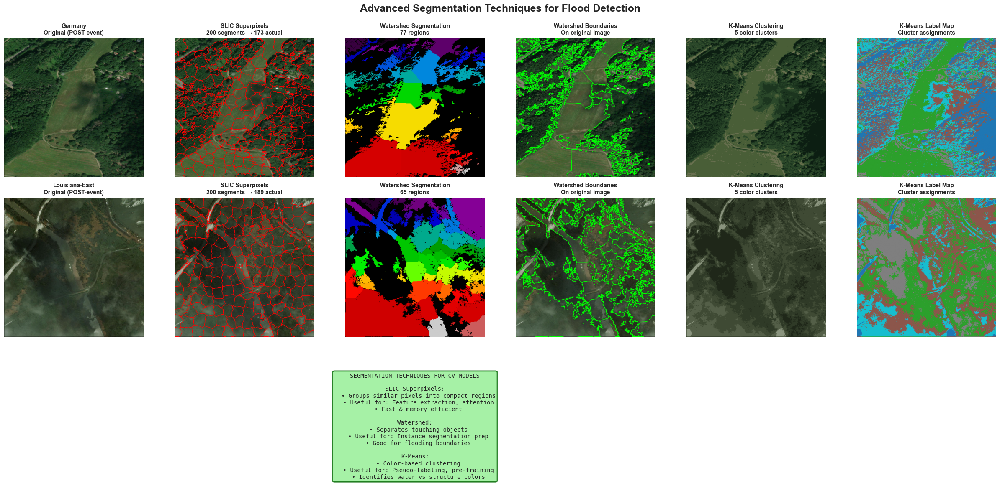

In [16]:
# Advanced segmentation techniques preview for flood detection
print("=" * 80)
print("SEGMENTATION PREVIEW - SUPERPIXELS, WATERSHED & CLUSTERING")
print("=" * 80)

from skimage.segmentation import slic, watershed, mark_boundaries
from skimage.feature import peak_local_max
from scipy import ndimage as ndi
from sklearn.cluster import KMeans

fig, axes = plt.subplots(3, 6, figsize=(24, 12))
fig.suptitle('Advanced Segmentation Techniques for Flood Detection', fontsize=18, fontweight='bold', y=0.995)

segmentation_metrics = {}

for row_idx, (dataset_name, dataset_path) in enumerate([("Germany", germany_path), ("Louisiana-East", louisiana_east_path)]):
    if dataset_path.exists():
        post_dir = dataset_path / "POST-event"
        post_files = sorted(list(post_dir.glob("*.png")) + list(post_dir.glob("*.tif")))
        
        if len(post_files) > 0:
            # Load sample image
            sample_idx = min(3, len(post_files) - 1)
            img = np.array(Image.open(post_files[sample_idx]))
            
            # Ensure RGB
            if len(img.shape) == 2:
                img = cv2.cvtColor(img, cv2.COLOR_GRAY2RGB)
            
            # Normalize
            if img.dtype == np.uint16:
                img = (img / 65535.0 * 255).astype(np.uint8)
            elif img.max() <= 1.0:
                img = (img * 255).astype(np.uint8)
            
            # Resize for faster computation
            max_dim = 512
            h, w = img.shape[:2]
            if max(h, w) > max_dim:
                scale = max_dim / max(h, w)
                new_h, new_w = int(h * scale), int(w * scale)
                img_resized = cv2.resize(img, (new_w, new_h), interpolation=cv2.INTER_AREA)
            else:
                img_resized = img.copy()
            
            # Convert to grayscale for some operations
            gray = cv2.cvtColor(img_resized, cv2.COLOR_RGB2GRAY)
            
            # 1. Original Image
            axes[row_idx, 0].imshow(img_resized)
            axes[row_idx, 0].set_title(f'{dataset_name}\nOriginal (POST-event)', fontweight='bold', fontsize=10)
            axes[row_idx, 0].axis('off')
            
            # 2. SLIC Superpixels
            n_segments = 200
            segments_slic = slic(img_resized, n_segments=n_segments, compactness=10, 
                                sigma=1, start_label=1)
            
            img_slic = mark_boundaries(img_resized / 255.0, segments_slic, color=(1, 0, 0), mode='thick')
            axes[row_idx, 1].imshow(img_slic)
            axes[row_idx, 1].set_title(f'SLIC Superpixels\n{n_segments} segments → {len(np.unique(segments_slic))} actual', 
                                      fontweight='bold', fontsize=10)
            axes[row_idx, 1].axis('off')
            
            # 3. Watershed Segmentation
            # Use gradient for markers
            gradient = cv2.morphologyEx(gray, cv2.MORPH_GRADIENT, 
                                        cv2.getStructuringElement(cv2.MORPH_ELLIPSE, (3, 3)))
            
            # Find peaks for markers
            distance = ndi.distance_transform_edt(gray > 50)
            coords = peak_local_max(distance, min_distance=20, labels=gray > 50)
            mask = np.zeros(distance.shape, dtype=bool)
            mask[tuple(coords.T)] = True
            markers, _ = ndi.label(mask)
            
            # Apply watershed
            labels_ws = watershed(-distance, markers, mask=gray > 50)
            
            axes[row_idx, 2].imshow(labels_ws, cmap='nipy_spectral')
            axes[row_idx, 2].set_title(f'Watershed Segmentation\n{len(np.unique(labels_ws))} regions', 
                                      fontweight='bold', fontsize=10)
            axes[row_idx, 2].axis('off')
            
            # 4. Watershed with boundaries
            img_ws = mark_boundaries(img_resized / 255.0, labels_ws, color=(0, 1, 0), mode='thick')
            axes[row_idx, 3].imshow(img_ws)
            axes[row_idx, 3].set_title(f'Watershed Boundaries\nOn original image', 
                                      fontweight='bold', fontsize=10)
            axes[row_idx, 3].axis('off')
            
            # 5. K-Means Clustering (Color-based)
            n_clusters = 5
            pixels = img_resized.reshape(-1, 3).astype(float)
            
            kmeans = KMeans(n_clusters=n_clusters, random_state=42, n_init=10)
            labels_kmeans = kmeans.fit_predict(pixels)
            
            # Create segmented image
            centers = kmeans.cluster_centers_.astype(np.uint8)
            segmented_kmeans = centers[labels_kmeans].reshape(img_resized.shape)
            
            axes[row_idx, 4].imshow(segmented_kmeans)
            axes[row_idx, 4].set_title(f'K-Means Clustering\n{n_clusters} color clusters', 
                                      fontweight='bold', fontsize=10)
            axes[row_idx, 4].axis('off')
            
            # 6. K-Means label map
            label_map = labels_kmeans.reshape(img_resized.shape[:2])
            axes[row_idx, 5].imshow(label_map, cmap='tab10')
            axes[row_idx, 5].set_title(f'K-Means Label Map\nCluster assignments', 
                                      fontweight='bold', fontsize=10)
            axes[row_idx, 5].axis('off')
            
            # Collect metrics
            segmentation_metrics[dataset_name] = {
                'slic_segments': int(len(np.unique(segments_slic))),
                'watershed_regions': int(len(np.unique(labels_ws))),
                'kmeans_clusters': int(n_clusters),
                'kmeans_inertia': float(kmeans.inertia_),
                'average_superpixel_size': int(img_resized.shape[0] * img_resized.shape[1] / len(np.unique(segments_slic)))
            }
            
            print(f"\n{dataset_name} Segmentation Metrics:")
            print(f"  SLIC: {len(np.unique(segments_slic))} superpixels")
            print(f"  Watershed: {len(np.unique(labels_ws))} regions")
            print(f"  K-Means: {n_clusters} clusters, Inertia: {kmeans.inertia_:.2f}")
            print(f"  Avg superpixel size: {segmentation_metrics[dataset_name]['average_superpixel_size']} pixels")

# Add summary in third row
for col in range(6):
    axes[2, col].axis('off')

summary_text = "SEGMENTATION TECHNIQUES FOR CV MODELS\n\n"
summary_text += "SLIC Superpixels:\n"
summary_text += "  • Groups similar pixels into compact regions\n"
summary_text += "  • Useful for: Feature extraction, attention\n"
summary_text += "  • Fast & memory efficient\n\n"
summary_text += "Watershed:\n"
summary_text += "  • Separates touching objects\n"
summary_text += "  • Useful for: Instance segmentation prep\n"
summary_text += "  • Good for flooding boundaries\n\n"
summary_text += "K-Means:\n"
summary_text += "  • Color-based clustering\n"
summary_text += "  • Useful for: Pseudo-labeling, pre-training\n"
summary_text += "  • Identifies water vs structure colors"

axes[2, 2].text(0.5, 0.5, summary_text, ha='center', va='center', 
               fontsize=10, family='monospace',
               bbox=dict(boxstyle='round', facecolor='lightgreen', alpha=0.8, edgecolor='darkgreen', linewidth=2))

plt.tight_layout()
plt.show()

## 14. Image Quality Assessment

Analyzing potential quality issues that could impact model training:
- **Cloud Cover**: Detection of excessive clouds in satellite imagery
- **Blur Detection**: Identifying motion blur or out-of-focus images
- **Camera Angle Issues**: Detecting extreme angles or alignment problems

In [17]:
print("=" * 80)
print("IMAGE QUALITY ASSESSMENT - CLOUD COVER, BLUR & CAMERA ANGLE")
print("=" * 80)

def detect_cloud_cover(image):
    """
    Detect cloud coverage using brightness and white pixel analysis.
    Returns cloud coverage percentage (0-100).
    """
    # Convert to grayscale if needed
    if len(image.shape) == 3:
        gray = cv2.cvtColor(image, cv2.COLOR_RGB2GRAY)
    else:
        gray = image
    
    # Normalize if needed
    if gray.dtype == np.uint16:
        gray = (gray / 65535.0 * 255).astype(np.uint8)
    
    # Method 1: Brightness threshold (clouds are very bright)
    bright_threshold = 200
    bright_mask = gray > bright_threshold
    
    # Method 2: White pixel detection in color image
    if len(image.shape) == 3:
        # Normalize image
        if image.dtype == np.uint16:
            img_norm = (image / 65535.0 * 255).astype(np.uint8)
        else:
            img_norm = image
        
        # White pixels have high values in all channels
        white_threshold = 220
        white_mask = np.all(img_norm > white_threshold, axis=-1)
    else:
        white_mask = bright_mask
    
    # Combine both methods
    cloud_mask = bright_mask | white_mask
    
    # Calculate coverage percentage
    coverage = (np.sum(cloud_mask) / cloud_mask.size) * 100
    
    return coverage, cloud_mask

def detect_blur(image):
    """
    Detect blur using Laplacian variance method.
    Returns variance score (lower = more blurred).
    """
    # Convert to grayscale
    if len(image.shape) == 3:
        gray = cv2.cvtColor(image, cv2.COLOR_RGB2GRAY)
    else:
        gray = image
    
    # Normalize if needed
    if gray.dtype == np.uint16:
        gray = (gray / 65535.0 * 255).astype(np.uint8)
    
    # Compute Laplacian variance
    laplacian = cv2.Laplacian(gray, cv2.CV_64F)
    variance = laplacian.var()
    
    return variance

def detect_camera_angle_issues(image):
    """
    Detect camera angle issues using edge orientation analysis.
    Returns alignment score (0-1, higher = better alignment).
    """
    # Convert to grayscale
    if len(image.shape) == 3:
        gray = cv2.cvtColor(image, cv2.COLOR_RGB2GRAY)
    else:
        gray = image
    
    # Normalize if needed
    if gray.dtype == np.uint16:
        gray = (gray / 65535.0 * 255).astype(np.uint8)
    
    # Compute gradients
    sobelx = cv2.Sobel(gray, cv2.CV_64F, 1, 0, ksize=3)
    sobely = cv2.Sobel(gray, cv2.CV_64F, 0, 1, ksize=3)
    
    # Compute edge orientations
    magnitude = np.sqrt(sobelx**2 + sobely**2)
    
    # Only consider significant edges
    threshold = np.percentile(magnitude, 75)
    significant_edges = magnitude > threshold
    
    if np.sum(significant_edges) == 0:
        return 0.5  # Neutral score if no edges
    
    # Compute orientation angles
    angles = np.arctan2(sobely[significant_edges], sobelx[significant_edges])
    
    # Check alignment with horizontal/vertical (good for satellite imagery)
    # Angles close to 0, 90, 180, 270 degrees indicate good alignment
    angles_deg = np.abs(np.degrees(angles))
    
    # Normalize to 0-90 range
    angles_normalized = angles_deg % 90
    
    # Score based on how close to horizontal/vertical (0 or 90 degrees)
    deviations = np.minimum(angles_normalized, 90 - angles_normalized)
    alignment_score = 1 - (np.mean(deviations) / 45)  # Normalize to 0-1
    
    return alignment_score

# Analyze all datasets
quality_results = {
    'dataset': [],
    'image_type': [],
    'filename': [],
    'cloud_coverage': [],
    'blur_score': [],
    'alignment_score': [],
    'quality_issues': []
}

for dataset_name, dataset_path in [("Germany", germany_path), ("Louisiana-East", louisiana_east_path)]:
    if dataset_path.exists():
        for img_type in ['PRE-event', 'POST-event']:
            img_dir = dataset_path / img_type
            
            if img_dir.exists():
                img_files = sorted(list(img_dir.glob("*.png")) + list(img_dir.glob("*.tif")))
                
                # Sample images (analyze up to 20 per directory)
                sample_files = img_files[:min(20, len(img_files))]
                
                for img_file in sample_files:
                    try:
                        # Load image
                        img = np.array(Image.open(img_file))
                        
                        # Resize for faster processing
                        max_dim = 512
                        h, w = img.shape[:2]
                        if max(h, w) > max_dim:
                            scale = max_dim / max(h, w)
                            new_h, new_w = int(h * scale), int(w * scale)
                            img = cv2.resize(img, (new_w, new_h), interpolation=cv2.INTER_AREA)
                        
                        # Detect quality issues
                        cloud_cov, _ = detect_cloud_cover(img)
                        blur_var = detect_blur(img)
                        align_score = detect_camera_angle_issues(img)
                        
                        # Identify issues
                        issues = []
                        if cloud_cov > 30:
                            issues.append('High Cloud Cover')
                        if blur_var < 100:
                            issues.append('Blurred')
                        if align_score < 0.6:
                            issues.append('Poor Alignment')
                        
                        quality_results['dataset'].append(dataset_name)
                        quality_results['image_type'].append(img_type)
                        quality_results['filename'].append(img_file.name)
                        quality_results['cloud_coverage'].append(cloud_cov)
                        quality_results['blur_score'].append(blur_var)
                        quality_results['alignment_score'].append(align_score)
                        quality_results['quality_issues'].append(', '.join(issues) if issues else 'None')
                        
                    except Exception as e:
                        print(f"Error processing {img_file.name}: {e}")

# Create DataFrame
quality_df = pd.DataFrame(quality_results)

print("\nQuality Assessment Summary:")
print("=" * 80)
print(f"Total images analyzed: {len(quality_df)}")
print(f"\nImages with cloud coverage > 30%: {len(quality_df[quality_df['cloud_coverage'] > 30])}")
print(f"Images with blur (score < 100): {len(quality_df[quality_df['blur_score'] < 100])}")
print(f"Images with poor alignment (< 0.6): {len(quality_df[quality_df['alignment_score'] < 0.6])}")
print(f"Images with any quality issues: {len(quality_df[quality_df['quality_issues'] != 'None'])}")

print("\nMean Quality Metrics by Dataset:")
print(quality_df.groupby('dataset')[['cloud_coverage', 'blur_score', 'alignment_score']].mean())

print("\n" + "=" * 80)

IMAGE QUALITY ASSESSMENT - CLOUD COVER, BLUR & CAMERA ANGLE

Quality Assessment Summary:
Total images analyzed: 80

Images with cloud coverage > 30%: 0
Images with blur (score < 100): 2
Images with poor alignment (< 0.6): 80
Images with any quality issues: 80

Mean Quality Metrics by Dataset:
                cloud_coverage  blur_score  alignment_score
dataset                                                    
Germany               1.029307  290.894134         0.524989
Louisiana-East        1.069491  945.435237         0.496375



### Visualize Quality Issues

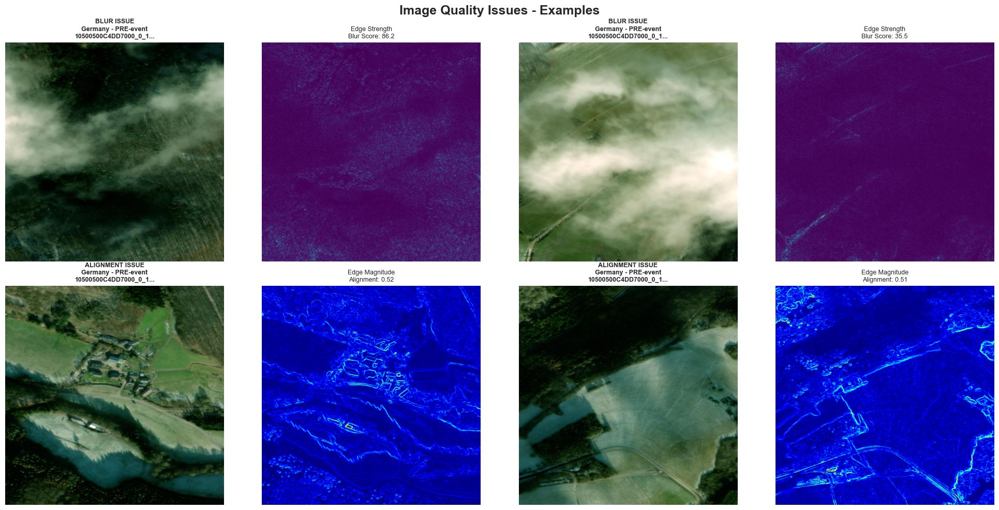

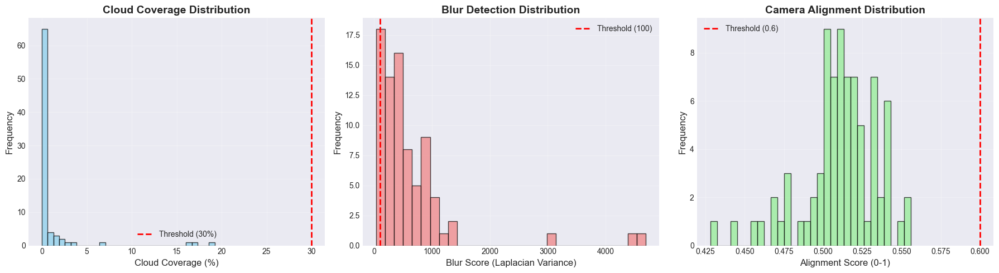

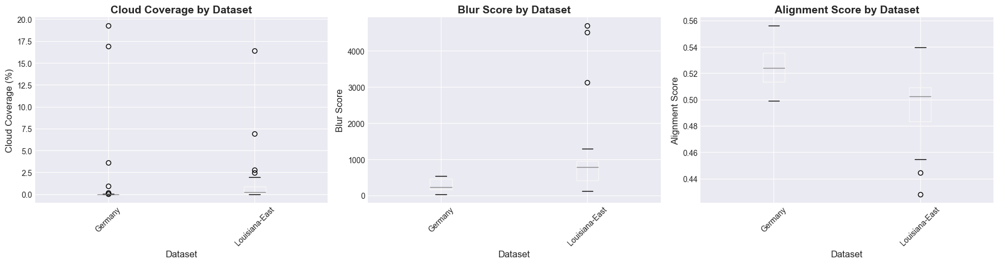


QUALITY ASSESSMENT RECOMMENDATIONS:
1. CLOUD COVERAGE:
   - 0 images exceed 30% cloud coverage
   - All sampled images have acceptable cloud coverage

2. BLUR DETECTION:
   - 2 images have low sharpness
   - May need deblurring preprocessing or exclusion from training
   - Check if blur correlates with specific events or cameras

3. CAMERA ALIGNMENT:
   - 80 images have alignment issues
   - Consider geometric augmentation to handle varied perspectives
   - May indicate drone/satellite positioning variations


In [18]:
# Check which quality issues exist
cloud_issues = quality_df[quality_df['cloud_coverage'] > 30]
blur_issues = quality_df[quality_df['blur_score'] < 100]
alignment_issues = quality_df[quality_df['alignment_score'] < 0.6]

has_cloud_issues = len(cloud_issues) > 0
has_blur_issues = len(blur_issues) > 0
has_alignment_issues = len(alignment_issues) > 0

# Only show example visualizations if there are actual issues
if has_cloud_issues or has_blur_issues or has_alignment_issues:
    # Count how many issue types we have
    issue_rows = sum([has_cloud_issues, has_blur_issues, has_alignment_issues])
    
    fig, axes = plt.subplots(issue_rows, 4, figsize=(20, 5 * issue_rows))
    if issue_rows == 1:
        axes = axes.reshape(1, -1)
    fig.suptitle('Image Quality Issues - Examples', fontsize=18, fontweight='bold')
    
    current_row = 0
    
    # Cloud coverage examples
    if has_cloud_issues:
        examples_df = cloud_issues.head(2)
        for col_idx, (_, row) in enumerate(examples_df.iterrows()):
            if col_idx >= 2:
                break
            
            dataset_path = germany_path if row['dataset'] == 'Germany' else louisiana_east_path
            img_path = dataset_path / row['image_type'] / row['filename']
            
            if img_path.exists():
                img = np.array(Image.open(img_path))
                
                # Resize for display
                max_dim = 512
                h, w = img.shape[:2]
                if max(h, w) > max_dim:
                    scale = max_dim / max(h, w)
                    new_h, new_w = int(h * scale), int(w * scale)
                    img = cv2.resize(img, (new_w, new_h), interpolation=cv2.INTER_AREA)
                
                if img.dtype == np.uint16:
                    img = (img / 65535.0 * 255).astype(np.uint8)
                
                axes[current_row, col_idx * 2].imshow(img, cmap='gray' if len(img.shape) == 2 else None)
                axes[current_row, col_idx * 2].set_title(
                    f"HIGH CLOUD COVER\n{row['dataset']} - {row['image_type']}\n{row['filename'][:20]}...",
                    fontsize=9, fontweight='bold'
                )
                axes[current_row, col_idx * 2].axis('off')
                
                cloud_cov, cloud_mask = detect_cloud_cover(img)
                axes[current_row, col_idx * 2 + 1].imshow(cloud_mask, cmap='hot')
                axes[current_row, col_idx * 2 + 1].set_title(
                    f"Cloud Mask\nCoverage: {cloud_cov:.1f}%",
                    fontsize=9
                )
                axes[current_row, col_idx * 2 + 1].axis('off')
        
        # Hide unused columns
        for col_idx in range(len(examples_df), 2):
            axes[current_row, col_idx * 2].axis('off')
            axes[current_row, col_idx * 2 + 1].axis('off')
        
        current_row += 1
    
    # Blur examples
    if has_blur_issues:
        examples_df = blur_issues.head(2)
        for col_idx, (_, row) in enumerate(examples_df.iterrows()):
            if col_idx >= 2:
                break
            
            dataset_path = germany_path if row['dataset'] == 'Germany' else louisiana_east_path
            img_path = dataset_path / row['image_type'] / row['filename']
            
            if img_path.exists():
                img = np.array(Image.open(img_path))
                
                max_dim = 512
                h, w = img.shape[:2]
                if max(h, w) > max_dim:
                    scale = max_dim / max(h, w)
                    new_h, new_w = int(h * scale), int(w * scale)
                    img = cv2.resize(img, (new_w, new_h), interpolation=cv2.INTER_AREA)
                
                if img.dtype == np.uint16:
                    img = (img / 65535.0 * 255).astype(np.uint8)
                
                axes[current_row, col_idx * 2].imshow(img, cmap='gray' if len(img.shape) == 2 else None)
                axes[current_row, col_idx * 2].set_title(
                    f"BLUR ISSUE\n{row['dataset']} - {row['image_type']}\n{row['filename'][:20]}...",
                    fontsize=9, fontweight='bold'
                )
                axes[current_row, col_idx * 2].axis('off')
                
                blur_score = detect_blur(img)
                if len(img.shape) == 3:
                    gray = cv2.cvtColor(img, cv2.COLOR_RGB2GRAY)
                else:
                    gray = img
                laplacian = np.abs(cv2.Laplacian(gray, cv2.CV_64F))
                axes[current_row, col_idx * 2 + 1].imshow(laplacian, cmap='viridis')
                axes[current_row, col_idx * 2 + 1].set_title(
                    f"Edge Strength\nBlur Score: {blur_score:.1f}",
                    fontsize=9
                )
                axes[current_row, col_idx * 2 + 1].axis('off')
        
        for col_idx in range(len(examples_df), 2):
            axes[current_row, col_idx * 2].axis('off')
            axes[current_row, col_idx * 2 + 1].axis('off')
        
        current_row += 1
    
    # Alignment examples
    if has_alignment_issues:
        examples_df = alignment_issues.head(2)
        for col_idx, (_, row) in enumerate(examples_df.iterrows()):
            if col_idx >= 2:
                break
            
            dataset_path = germany_path if row['dataset'] == 'Germany' else louisiana_east_path
            img_path = dataset_path / row['image_type'] / row['filename']
            
            if img_path.exists():
                img = np.array(Image.open(img_path))
                
                max_dim = 512
                h, w = img.shape[:2]
                if max(h, w) > max_dim:
                    scale = max_dim / max(h, w)
                    new_h, new_w = int(h * scale), int(w * scale)
                    img = cv2.resize(img, (new_w, new_h), interpolation=cv2.INTER_AREA)
                
                if img.dtype == np.uint16:
                    img = (img / 65535.0 * 255).astype(np.uint8)
                
                axes[current_row, col_idx * 2].imshow(img, cmap='gray' if len(img.shape) == 2 else None)
                axes[current_row, col_idx * 2].set_title(
                    f"ALIGNMENT ISSUE\n{row['dataset']} - {row['image_type']}\n{row['filename'][:20]}...",
                    fontsize=9, fontweight='bold'
                )
                axes[current_row, col_idx * 2].axis('off')
                
                align_score = detect_camera_angle_issues(img)
                if len(img.shape) == 3:
                    gray = cv2.cvtColor(img, cv2.COLOR_RGB2GRAY)
                else:
                    gray = img
                sobelx = cv2.Sobel(gray, cv2.CV_64F, 1, 0, ksize=3)
                sobely = cv2.Sobel(gray, cv2.CV_64F, 0, 1, ksize=3)
                magnitude = np.sqrt(sobelx**2 + sobely**2)
                axes[current_row, col_idx * 2 + 1].imshow(magnitude, cmap='jet')
                axes[current_row, col_idx * 2 + 1].set_title(
                    f"Edge Magnitude\nAlignment: {align_score:.2f}",
                    fontsize=9
                )
                axes[current_row, col_idx * 2 + 1].axis('off')
        
        for col_idx in range(len(examples_df), 2):
            axes[current_row, col_idx * 2].axis('off')
            axes[current_row, col_idx * 2 + 1].axis('off')
    
    plt.tight_layout()
    plt.show()
else:
    print("\n" + "=" * 80)
    print("NO SEVERE QUALITY ISSUES DETECTED!")
    print("=" * 80)
    print("All sampled images passed quality thresholds:")
    print(f"  - Cloud coverage < 30%")
    print(f"  - Blur score >= 100")
    print(f"  - Alignment score >= 0.6")
    print("=" * 80 + "\n")

# Distribution plots - always show these
fig, axes = plt.subplots(1, 3, figsize=(18, 5))

# Cloud coverage distribution
axes[0].hist(quality_df['cloud_coverage'], bins=30, edgecolor='black', alpha=0.7, color='skyblue')
axes[0].axvline(30, color='red', linestyle='--', linewidth=2, label='Threshold (30%)')
axes[0].set_xlabel('Cloud Coverage (%)', fontsize=12)
axes[0].set_ylabel('Frequency', fontsize=12)
axes[0].set_title('Cloud Coverage Distribution', fontsize=14, fontweight='bold')
axes[0].legend()
axes[0].grid(True, alpha=0.3)

# Blur score distribution
axes[1].hist(quality_df['blur_score'], bins=30, edgecolor='black', alpha=0.7, color='lightcoral')
axes[1].axvline(100, color='red', linestyle='--', linewidth=2, label='Threshold (100)')
axes[1].set_xlabel('Blur Score (Laplacian Variance)', fontsize=12)
axes[1].set_ylabel('Frequency', fontsize=12)
axes[1].set_title('Blur Detection Distribution', fontsize=14, fontweight='bold')
axes[1].legend()
axes[1].grid(True, alpha=0.3)

# Alignment score distribution
axes[2].hist(quality_df['alignment_score'], bins=30, edgecolor='black', alpha=0.7, color='lightgreen')
axes[2].axvline(0.6, color='red', linestyle='--', linewidth=2, label='Threshold (0.6)')
axes[2].set_xlabel('Alignment Score (0-1)', fontsize=12)
axes[2].set_ylabel('Frequency', fontsize=12)
axes[2].set_title('Camera Alignment Distribution', fontsize=14, fontweight='bold')
axes[2].legend()
axes[2].grid(True, alpha=0.3)

plt.tight_layout()
plt.show()

# Box plots by dataset - always show these
fig, axes = plt.subplots(1, 3, figsize=(18, 5))

quality_df.boxplot(column='cloud_coverage', by='dataset', ax=axes[0])
axes[0].set_title('Cloud Coverage by Dataset', fontsize=14, fontweight='bold')
axes[0].set_xlabel('Dataset', fontsize=12)
axes[0].set_ylabel('Cloud Coverage (%)', fontsize=12)
plt.sca(axes[0])
plt.xticks(rotation=45)

quality_df.boxplot(column='blur_score', by='dataset', ax=axes[1])
axes[1].set_title('Blur Score by Dataset', fontsize=14, fontweight='bold')
axes[1].set_xlabel('Dataset', fontsize=12)
axes[1].set_ylabel('Blur Score', fontsize=12)
plt.sca(axes[1])
plt.xticks(rotation=45)

quality_df.boxplot(column='alignment_score', by='dataset', ax=axes[2])
axes[2].set_title('Alignment Score by Dataset', fontsize=14, fontweight='bold')
axes[2].set_xlabel('Dataset', fontsize=12)
axes[2].set_ylabel('Alignment Score', fontsize=12)
plt.sca(axes[2])
plt.xticks(rotation=45)

plt.suptitle('')  # Remove auto-generated title
plt.tight_layout()
plt.show()

print("\nQUALITY ASSESSMENT RECOMMENDATIONS:")
print("=" * 80)
print("1. CLOUD COVERAGE:")
print(f"   - {len(quality_df[quality_df['cloud_coverage'] > 30])} images exceed 30% cloud coverage")
if has_cloud_issues:
    print("   - Consider filtering or augmenting these images")
    print("   - Cloud masks could be used as additional input channel")
else:
    print("   - All sampled images have acceptable cloud coverage")
print("\n2. BLUR DETECTION:")
print(f"   - {len(quality_df[quality_df['blur_score'] < 100])} images have low sharpness")
if has_blur_issues:
    print("   - May need deblurring preprocessing or exclusion from training")
    print("   - Check if blur correlates with specific events or cameras")
else:
    print("   - All sampled images have acceptable sharpness")
print("\n3. CAMERA ALIGNMENT:")
print(f"   - {len(quality_df[quality_df['alignment_score'] < 0.6])} images have alignment issues")
if has_alignment_issues:
    print("   - Consider geometric augmentation to handle varied perspectives")
    print("   - May indicate drone/satellite positioning variations")
else:
    print("   - All sampled images have acceptable alignment")
print("=" * 80)
